# DiffusionPDE

## Prepare

In [1]:
import tqdm
import pickle
import numpy as np
import torch
import PIL.Image
import dnnlib
import torch.nn.functional as F
from torch_utils import distributed as dist
import scipy.io
import h5py
import matplotlib.pyplot as plt
import copy

In [2]:
from scripts.generate_poisson import *
from scripts.generate_helmholtz import *
from scripts.generate_ns_nonbounded import *
from scripts.generate_darcy import *

In [3]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['axes.unicode_minus'] = False

In [4]:
data_path = "/large_storage/zhangxf/PDEdata/"
model_path = "/research_data/users/zhangxifeng/C01Python/DiffusionPDE/output/pretrained/"

## Single-operator

### Poisson

In [6]:
# !python -u merge_data.py --type='poisson' --n=10000 --s=128

In [7]:
# !torchrun --master_addr=127.0.0.1 --master_port=12353 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/models/pretrained-poisson-new --data=/data0/zhangxf/PDEdata/poisson-merged/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05 --resume=/data0/zhangxf/models/pretrained-poisson-new/00000--uncond-ddpmpp-edm-gpus3-batch60-fp32/training-state-002004.pt

In [5]:
with open("/research_data/users/zhangxifeng/C01Python/DiffusionPDE/output/pretrained/pretrained-poisson.pkl", "rb") as f:
    obj = pickle.load(f)

obj.keys()

dict_keys(['ema', 'loss_fn', 'augment_pipe', 'dataset_kwargs'])

In [12]:
obj['ema']

EDMPrecond(
  (model): SongUNet(
    (map_noise): PositionalEmbedding()
    (map_augment): Linear()
    (map_layer0): Linear()
    (map_layer1): Linear()
    (enc): ModuleDict(
      (128x128_conv): Conv2d()
      (128x128_block0): UNetBlock(
        (norm0): GroupNorm()
        (conv0): Conv2d()
        (affine): Linear()
        (norm1): GroupNorm()
        (conv1): Conv2d()
        (skip): Conv2d()
      )
      (128x128_block1): UNetBlock(
        (norm0): GroupNorm()
        (conv0): Conv2d()
        (affine): Linear()
        (norm1): GroupNorm()
        (conv1): Conv2d()
      )
      (128x128_block2): UNetBlock(
        (norm0): GroupNorm()
        (conv0): Conv2d()
        (affine): Linear()
        (norm1): GroupNorm()
        (conv1): Conv2d()
      )
      (128x128_block3): UNetBlock(
        (norm0): GroupNorm()
        (conv0): Conv2d()
        (affine): Linear()
        (norm1): GroupNorm()
        (conv1): Conv2d()
      )
      (64x64_down): UNetBlock(
        (norm0):

In [8]:
poisson_config={
    "data": {
        "name": 'Poisson',
        "datapath": '/large_storage/zhangxf/PDEdata/poisson/poisson_1000-128-128_test.mat',
        "offset": 0,
        "obs_size": 500
    },
    "test": {
        "pre-trained": '/research_data/users/zhangxifeng/C01Python/DiffusionPDE/output/pretrained/pretrained-poisson.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:1',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 400,
        "zeta_obs_u": 20000,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [6]:
# Global True
poisson_testdata = scipy.io.loadmat(poisson_config["data"]["datapath"])
poisson_testdata['f_data'].shape, poisson_testdata['phi_data'].shape

((1000, 128, 128), (1000, 128, 128))

In [10]:
# Sample without guide
poisson_config['generate']['guide'] = False
poisson_f_sample, poisson_phi_sample, poisson_f_index, poisson_phi_index = generate_poisson(poisson_config)

Loading networks from "/research_data/users/zhangxifeng/C01Python/DiffusionPDE/output/pretrained/pretrained-poisson.pkl"...
Generating 1 samples...


100%|████████████████████████████████████████████████████████████| 2000/2000 [02:41<00:00, 12.37step/s]


Done.


In [10]:
# Sample without obs_loss (f & phi) and pde_loss guide
poisson_config1 = copy.deepcopy(poisson_config)
poisson_config1['generate']['guide'] = True
poisson_f_sample_guide1, poisson_phi_sample_guide1, poisson_f_index1, poisson_phi_index1 = generate_poisson(poisson_config1)

Loading networks from "/research_data/users/zhangxifeng/C01Python/DiffusionPDE/output/pretrained/pretrained-poisson.pkl"...
Generating 1 samples...


100%|████████████████████████████████████████████████████████████| 2000/2000 [06:36<00:00,  5.05step/s]

Relative error of a: 0.055930756326922564
Relative error of u: 0.0014041732899403242
User declare no save.
Done.


Text(0.5, 1.0, 'Poisson $\\phi$ DiffusionPDE with Guide')

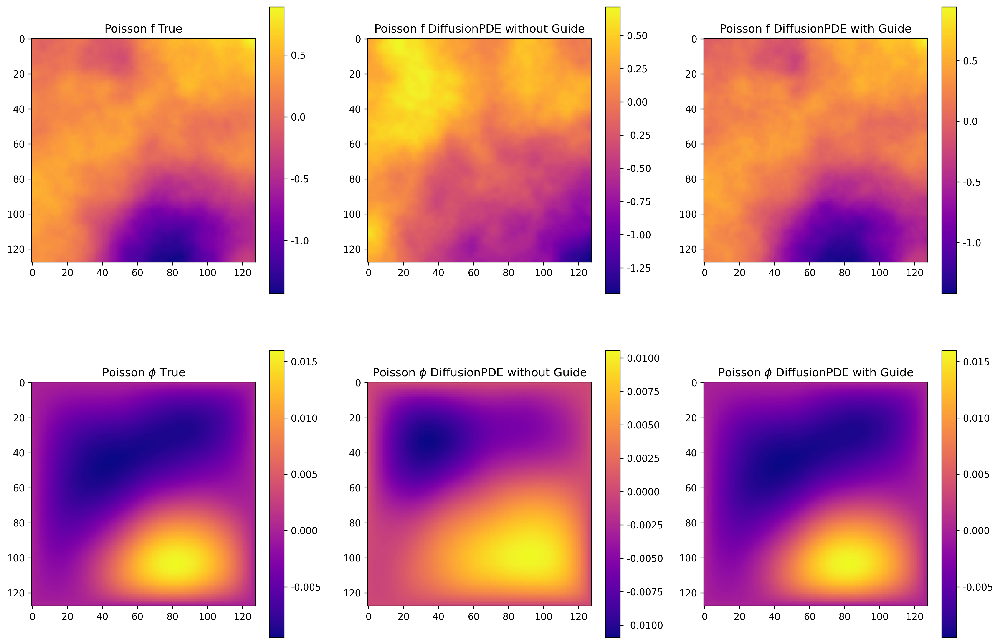

In [19]:
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(poisson_testdata['f_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f True')
plt.subplot(2, 3, 4)
plt.imshow(poisson_testdata['phi_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ True')

plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE without Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE without Guide')

plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE with Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE with Guide')

In [ ]:
# Sample without obs_loss (f & phi) and pde_loss guide
poisson_config2 = copy.deepcopy(poisson_config)
poisson_config2['generate']['guide'] = True
poisson_f_sample_guide2, poisson_phi_sample_guide2, poisson_f_index2, poisson_phi_index2 = generate_poisson(poisson_config2)

### Helmholtz

In [ ]:
!python -u merge_data.py --type='helmholtz' --n=10000 --s=128

In [ ]:
helmholtz = open("/data0/zhangxf/models/pretrained-models/pretrained-helmholtz.pkl", "rb")
fm4helmholtz = pickle.load(helmholtz)['ema']

In [ ]:
helmholtz_testdata = scipy.io.loadmat('/data0/zhangxf/PDEdata/helmholtz/helmholtz_10000-128-128_5.mat')
helmholtz_testdata['f_data'].shape, helmholtz_testdata['psi_data'].shape

((10000, 128, 128), (10000, 128, 128))

In [ ]:
hel_config={
    "data": {
        "name": 'Helmholtz',
        "datapath": '/data0/zhangxf/testPDEdata/helmholtz/testhelmholtz(k=3)_5000-64-64_1.mat',
        "offset": 0,
        "obs_size": 500,
        "pdeparam": 3
    },
    "test": {
        "pre-trained": '/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 80,
        "zeta_obs_u": 600,
        "zeta_pde": 100,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [ ]:
hel_config['generate']['guide'] = False
f_sample, psi_sample = generate_helmholtz(hel_config)

In [ ]:
hel_config['generate']['guide'] = True
f_sample_guide, psi_sample_guide = generate_helmholtz(hel_config)

In [ ]:
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(helmholtz_testdata['f_data'][0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('f True')
plt.subplot(2, 3, 4)
plt.imshow(helmholtz_testdata['psi_data'][0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'$\psi$ True')

plt.subplot(2, 3, 2)
plt.imshow(f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'f DiffusionPDE without Guide')
plt.subplot(2, 3, 5)
plt.imshow(psi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'$\psi$ DiffusionPDE without Guide')

plt.subplot(2, 3, 3)
plt.imshow(f_sample_guide[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'f DiffusionPDE with Guide')
plt.subplot(2, 3, 6)
plt.imshow(psi_sample_guide[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'$\psi$ DiffusionPDE with Guide')

### Navier-Stokes

#### Bounded

In [ ]:
ns_bounded = 

## Multi-operator

### Poisson + Helmholtz(k=1)

#### Training

In [ ]:
!python -u merge_data.py --type='poisson' --n=5000 --s=64 --mixed=True
!python -u merge_data.py --type='helmholtz' --n=5000 --s=64 --mixed=True
!python -u generate_labels.py

In [ ]:
# !CUDA_VISIBLE_DEVICES=3,4,5
# no label
!torchrun --master_addr=127.0.0.1 --master_port=12359 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/PDEdata/models/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-merged/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

# with label
!torchrun --master_addr=127.0.0.1 --master_port=12357 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/PDEdata/models/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-merged/ --cond=1 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

#### Sample Poisson

In [ ]:
poisson_config={
    "data": {
        "name": 'Poisson',
        "datapath": '/data0/zhangxf/testPDEdata/poisson/testpoisson_5000-64-64_1.mat',
        "offset": 0,
        "obs_size": 500
    },
    "test": {
        "pre-trained": '/data0/zhangxf/models/pretrained-models/pretrained-multi-poisson-hel.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 800,
        "zeta_obs_u": 4000,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [16]:
# Global True
poisson_testdata = scipy.io.loadmat('/data0/zhangxf/testPDEdata/poisson/testpoisson_5000-64-64_1.mat')
poisson_testdata['f_data'].shape, poisson_testdata['phi_data'].shape

((5000, 64, 64), (5000, 64, 64))

In [ ]:
# Sample without guide
poisson_config['generate']['guide'] = False
poisson_f_sample, poisson_phi_sample, poisson_f_index, poisson_phi_index = generate_poisson(poisson_config)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [01:17<00:00, 25.86step/s]

Done.


In [ ]:
# Sample without obs_loss (f & phi) and pde_loss guide
poisson_config1 = copy.deepcopy(poisson_config)
poisson_config1['generate']['guide'] = True
poisson_f_sample_guide1, poisson_phi_sample_guide1, poisson_f_index1, poisson_phi_index1 = generate_poisson(poisson_config1)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:57<00:00,  6.71step/s]

Relative error of a: 0.1524647670230635
Relative error of u: 0.015683628686092452
Done.


In [ ]:
# No PDE loss: Sample with just obs_loss guide
poisson_config2 = copy.deepcopy(poisson_config)
poisson_config2['generate']['guide'] = True
poisson_config2['generate']['zeta_pde'] = 0
poisson_f_sample_guide2, poisson_phi_sample_guide2, poisson_f_index2, poisson_phi_index2 = generate_poisson(poisson_config2)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:59<00:00,  6.69step/s]

Relative error of a: 0.13769715231118038
Relative error of u: 0.019665368583066473
Done.


In [ ]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
poisson_config3 = copy.deepcopy(poisson_config)
poisson_config3['generate']['full'] = True
poisson_config3['generate']['guide'] = True
poisson_config3['generate']['zeta_obs_u'] = 0
poisson_f_sample_guide3, poisson_phi_sample_guide3, poisson_f_index3, poisson_phi_index3 = generate_poisson(poisson_config3)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:52<00:00,  6.85step/s]

Relative error of a: 0.033296520235587344
Relative error of u: 0.6669076288626522
Done.


In [39]:
# Inverse problems: Sample with obs_loss (just phi) and pde_loss guide
poisson_config4 = copy.deepcopy(poisson_config)
poisson_config4['generate']['full'] = True
poisson_config4['generate']['guide'] = True
poisson_config4['generate']['zeta_obs_a'] = 0
poisson_f_sample_guide4, poisson_phi_sample_guide4, poisson_f_index4, poisson_phi_index4 = generate_poisson(poisson_config4)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:50<00:00,  6.88step/s]

Relative error of a: 0.2914103490416462
Relative error of u: 0.00302093976429184
Done.


Text(0.5, 1.0, 'Poisson $\\phi$ DiffusionPDE without Guide')

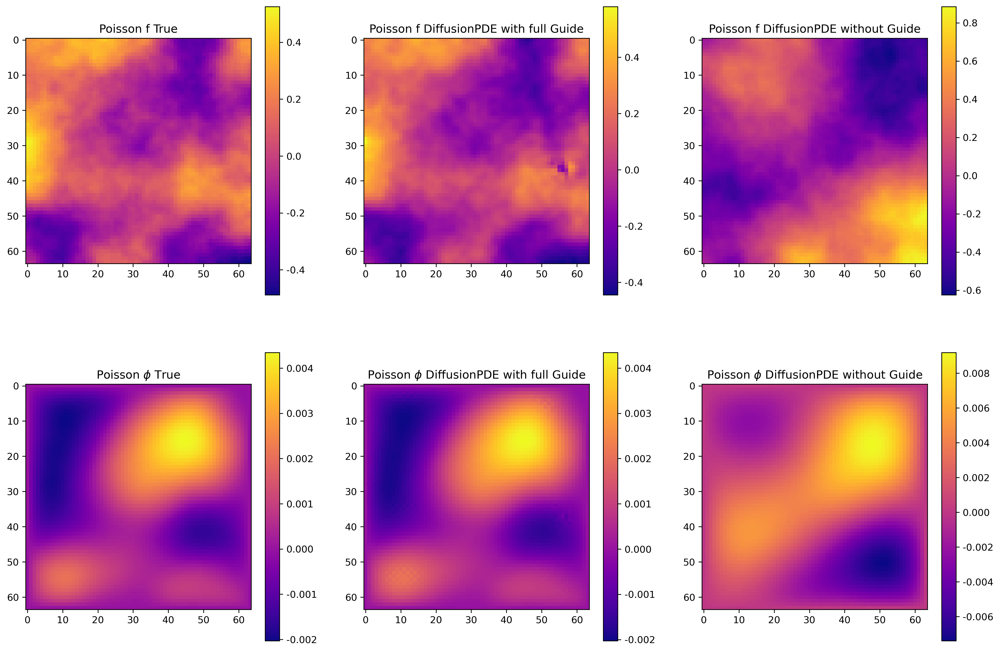

In [ ]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_testdata['f_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f True')
plt.subplot(2, 3, 4)
plt.imshow(poisson_testdata['phi_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ True')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE with full Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE with full Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'Poisson $\\phi$ DM4PDE with $\\phi$ Guide')

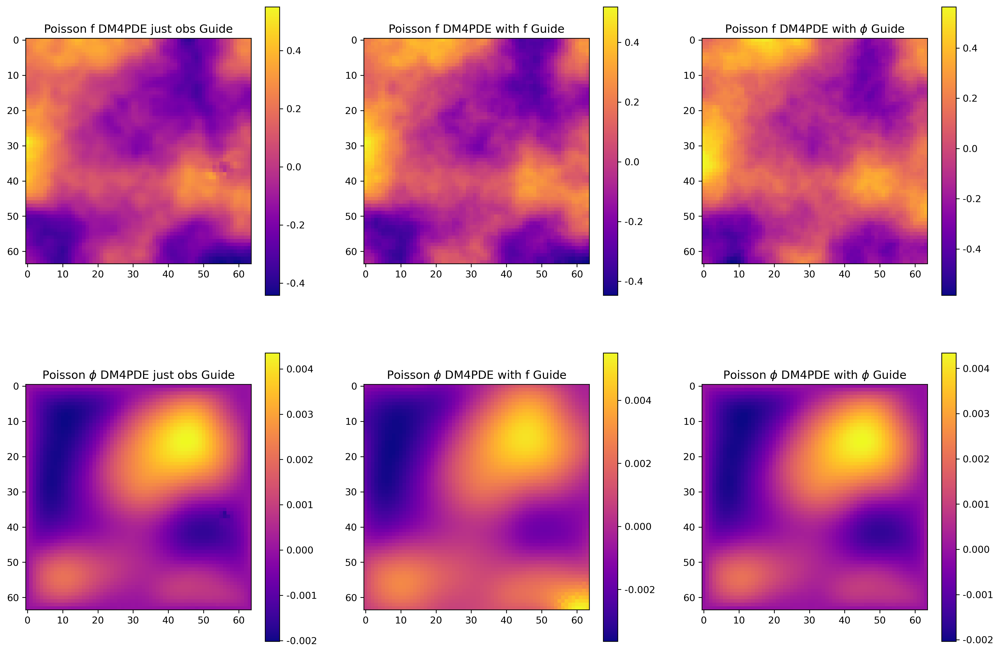

In [40]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(poisson_phi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with $\phi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with $\phi$ Guide')

#### Sample Helmholtz

In [ ]:
hel_config={
    "data": {
        "name": 'Helmholtz',
        "datapath": '/data0/zhangxf/testPDEdata/helmholtz/testhelmholtz(k=3)_5000-64-64_1.mat',
        "offset": 0,
        "obs_size": 500,
        "pdeparam": 3
    },
    "test": {
        "pre-trained": '/data0/zhangxf/models/pretrained-models/pretrained-multi-poisson-hel.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 80,
        "zeta_obs_u": 600,
        "zeta_pde": 100,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [43]:
# Global True
helmholtz_testdata = scipy.io.loadmat('/data0/zhangxf/testPDEdata/helmholtz/testhelmholtz(k=3)_5000-64-64_1.mat')
helmholtz_testdata['f_data'].shape, helmholtz_testdata['psi_data'].shape

((5000, 64, 64), (5000, 64, 64))

In [44]:
# Sample without guide
hel_config['generate']['guide'] = False
helmholtz_f_sample, helmholtz_psi_sample, helmholtz_f_index, helmholtz_psi_index = generate_helmholtz(hel_config)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [01:16<00:00, 26.02step/s]


Done.


In [45]:
# Sample without obs_loss (f & phi) and pde_loss guide
hel_config1 = copy.deepcopy(hel_config)
hel_config1['generate']['guide'] = True
helmholtz_f_sample_guide1, helmholtz_psi_sample_guide1, helmholtz_f_index1, helmholtz_psi_index1 = generate_helmholtz(hel_config1)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:41<00:00,  7.09step/s]

Relative error of a: 0.25842625168089345
Relative error of u: 2.5094328689528576
Done.


In [46]:
# Forward problems: Sample with just obs_loss guide
hel_config2 = copy.deepcopy(hel_config)
hel_config2['generate']['guide'] = True
hel_config2['generate']['zeta_pde'] = 0
helmholtz_f_sample_guide2, helmholtz_psi_sample_guide2, helmholtz_f_index2, helmholtz_psi_index2 = generate_helmholtz(hel_config2)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:37<00:00,  7.21step/s]

Relative error of a: 0.13138956749645175
Relative error of u: 0.012088685375919346
Done.


In [47]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
hel_config3 = copy.deepcopy(hel_config)
hel_config3['generate']['full'] = True
hel_config3['generate']['guide'] = True
hel_config3['generate']['zeta_obs_u'] = 0
helmholtz_f_sample_guide3, helmholtz_psi_sample_guide3, helmholtz_f_index3, helmholtz_psi_index3 = generate_helmholtz(hel_config3)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:40<00:00,  7.14step/s]


Relative error of a: 0.005786187618856788
Relative error of u: 2.509235497543843
Done.


In [48]:
# Inverse problems: Sample with obs_loss (just psi) and pde_loss guide
hel_config4 = copy.deepcopy(hel_config)
hel_config4['generate']['full'] = True
hel_config4['generate']['guide'] = True
hel_config4['generate']['zeta_obs_a'] = 0
helmholtz_f_sample_guide4, helmholtz_psi_sample_guide4, helmholtz_f_index4, helmholtz_psi_index4 = generate_helmholtz(hel_config4)

Loading networks from "/data0/zhangxf/PDEdata/models/pretrained-multi/00001--uncond-ddpmpp-edm-gpus3-batch60-fp32/network-snapshot-010020.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:37<00:00,  7.20step/s]

Relative error of a: 0.8264501496249007
Relative error of u: 2.517575726508214
Done.


Text(0.5, 1.0, 'helmholtz $\\psi$ DiffusionPDE without Guide')

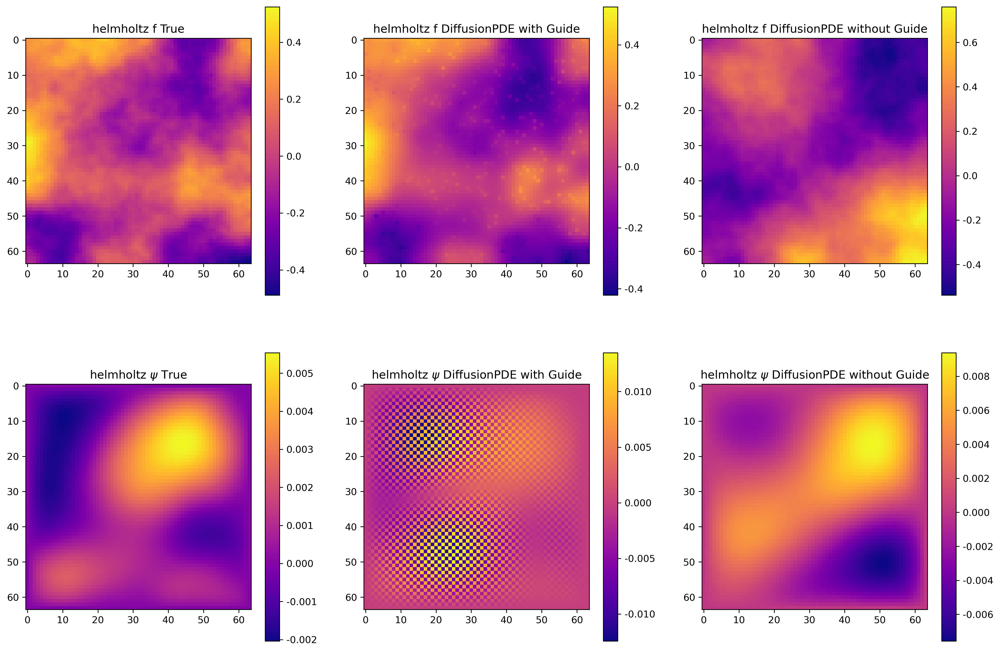

In [49]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(helmholtz_testdata['f_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('helmholtz f True')
plt.subplot(2, 3, 4)
plt.imshow(helmholtz_testdata['psi_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ True')
plt.subplot(2, 3, 2)
plt.imshow(helmholtz_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DiffusionPDE with Guide')
plt.subplot(2, 3, 5)
plt.imshow(helmholtz_psi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DiffusionPDE with Guide')
plt.subplot(2, 3, 3)
plt.imshow(helmholtz_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(helmholtz_psi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'helmholtz $\\psi$ DM4PDE with $\\psi$ Guide')

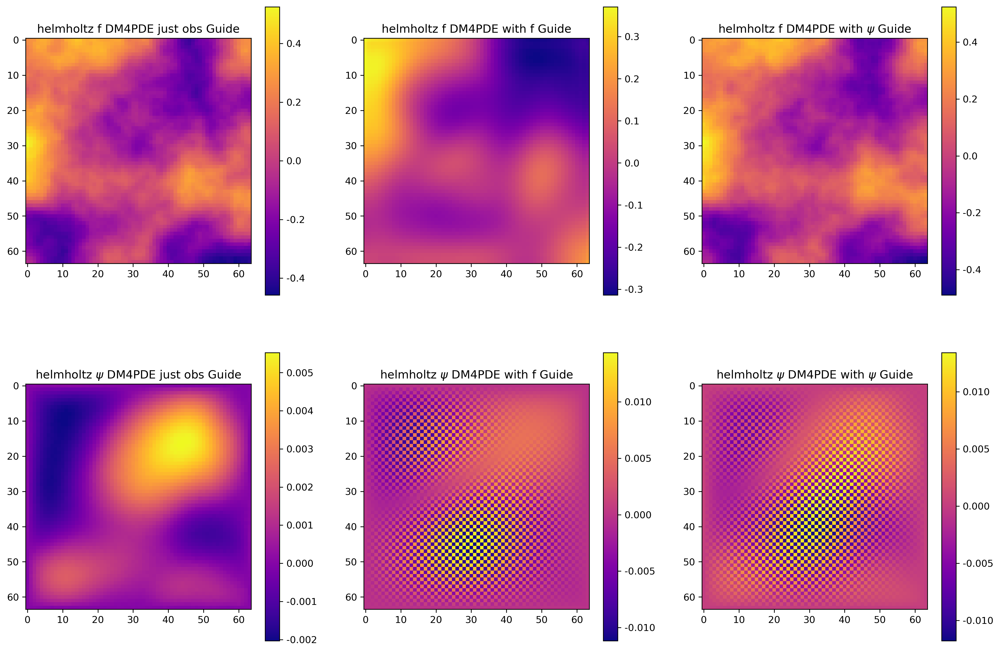

In [50]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(helmholtz_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('helmholtz f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(helmholtz_psi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(helmholtz_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(helmholtz_psi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(helmholtz_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DM4PDE with $\psi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(helmholtz_psi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE with $\psi$ Guide')

#### data view

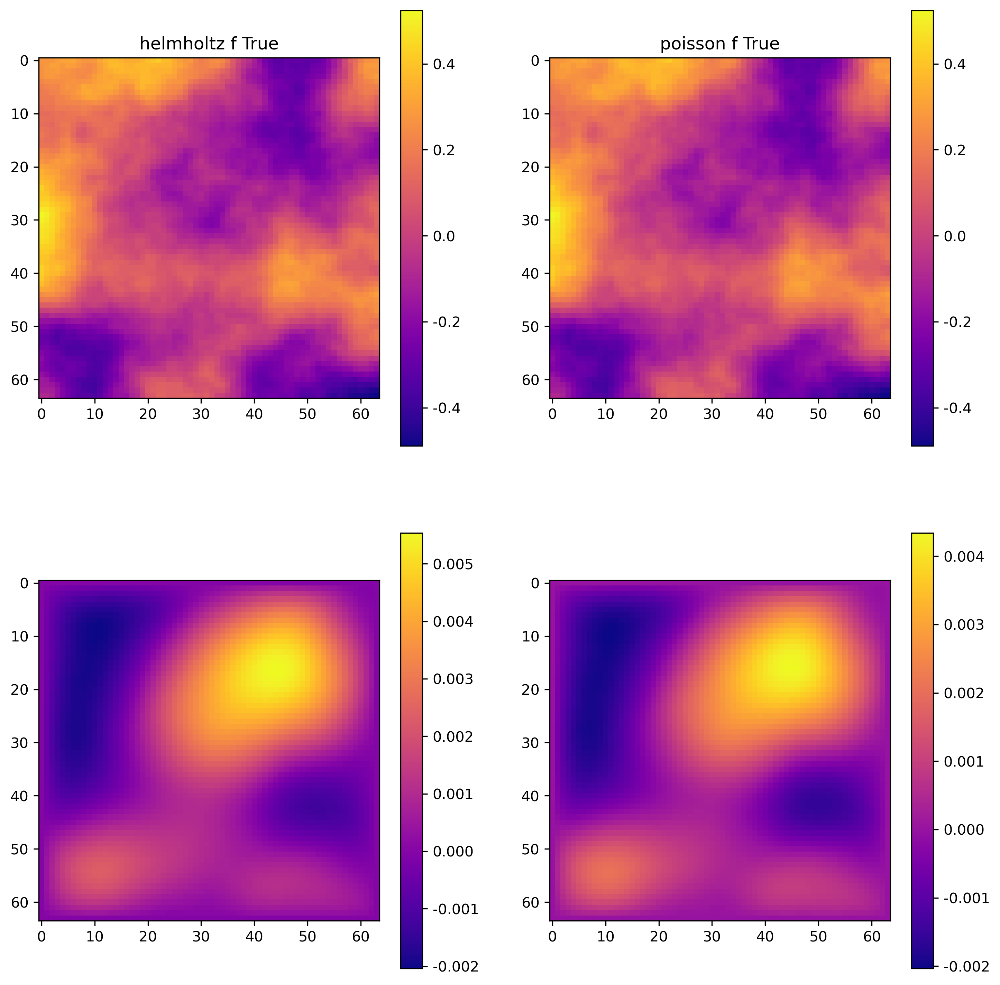

In [55]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(helmholtz_testdata['f_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('helmholtz f True')
plt.subplot(2, 3, 4)
plt.imshow(helmholtz_testdata['psi_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.subplot(2, 3, 2)
plt.imshow(poisson_testdata['f_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('poisson f True')
plt.subplot(2, 3, 5)
plt.imshow(poisson_testdata['phi_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()

#### Eval

In [ ]:
!python -u DM4PDEsampletest.py --pdetype='poisson' --evaltype='obseval' --pdeloss=True --problem='forward'
!python -u DM4PDEsampletest.py --pdetype='poisson' --evaltype='obseval' --pdeloss=True --problem='inverse'

### Poisson + Helmholtz ($k \in \{1, 2, 5, 10\}$)

#### Training

In [ ]:
!python -u merge_data.py --type='poisson' --n=5000 --s=64 --mixed=True
!python -u merge_data.py --type='helmholtz' --n=5000 --s=64 --mixed=True
!python -u merge_data.py --type='helmholtzk' --n=5000 --s=64 --mixed=True
!python -u generate_labels.py

In [ ]:
# !CUDA_VISIBLE_DEVICES=1,2,4
# no label
!torchrun --master_addr=127.0.0.1 --master_port=12359 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/models/DM4PDE/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-merged/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

!torchrun --master_addr=127.0.0.1 --master_port=12359 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/models/DM4PDE/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-merged2/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

!torchrun --master_addr=127.0.0.1 --master_port=12359 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/models/DM4PDE/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-poisson-helmholtz_128/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

# with label
!torchrun --master_addr=127.0.0.1 --master_port=12357 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/models/DM4PDE/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-merged/ --cond=1 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

#### Sample Poisson

In [8]:
poisson_config={
    "data": {
        "name": 'Poisson',
        "datapath": '/data0/zhangxf/testPDEdata/poisson/testpoisson_5000-64-64_1.mat',
        "offset": 4876,
        "obs_size": 500
    },
    "test": {
        "pre-trained": f'{model_path}/DM4poisson_helmholtz-new.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 800,
        "zeta_obs_u": 4000,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [9]:
# Global True
poisson_testdata = scipy.io.loadmat('/data0/zhangxf/testPDEdata/poisson/testpoisson_5000-64-64_1.mat')
poisson_testdata['f_data'].shape, poisson_testdata['phi_data'].shape

((5000, 64, 64), (5000, 64, 64))

In [10]:
# Sample without guide
poisson_config['generate']['guide'] = False
poisson_f_sample, poisson_phi_sample, poisson_f_index, poisson_phi_index = generate_poisson(poisson_config)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [01:13<00:00, 27.26step/s]

Done.


In [11]:
# Sample with obs_loss (f & phi) and pde_loss guide
poisson_config1 = copy.deepcopy(poisson_config)
poisson_config1['generate']['guide'] = True
poisson_f_sample_guide1, poisson_phi_sample_guide1, poisson_f_index1, poisson_phi_index1 = generate_poisson(poisson_config1)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:13<00:00,  6.37step/s]

Relative error of a: 0.1143661862454318
Relative error of u: 0.006247031155042698
Done.


In [12]:
# No PDE loss: Sample with just obs_loss guide
poisson_config2 = copy.deepcopy(poisson_config)
poisson_config2['generate']['guide'] = True
poisson_config2['generate']['zeta_pde'] = 0
poisson_f_sample_guide2, poisson_phi_sample_guide2, poisson_f_index2, poisson_phi_index2 = generate_poisson(poisson_config2)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:11<00:00,  6.42step/s]

Relative error of a: 0.11547648667097474
Relative error of u: 0.037330111334801734
Done.


In [13]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
poisson_config3 = copy.deepcopy(poisson_config)
poisson_config3['generate']['full'] = True
poisson_config3['generate']['guide'] = True
poisson_config3['generate']['zeta_obs_u'] = 0
poisson_f_sample_guide3, poisson_phi_sample_guide3, poisson_f_index3, poisson_phi_index3 = generate_poisson(poisson_config3)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:12<00:00,  6.40step/s]

Relative error of a: 0.029251013195520054
Relative error of u: 0.1709772976304066
Done.


In [14]:
# Inverse problems: Sample with obs_loss (just phi) and pde_loss guide
poisson_config4 = copy.deepcopy(poisson_config)
poisson_config4['generate']['full'] = True
poisson_config4['generate']['guide'] = True
poisson_config4['generate']['zeta_obs_a'] = 0
poisson_f_sample_guide4, poisson_phi_sample_guide4, poisson_f_index4, poisson_phi_index4 = generate_poisson(poisson_config4)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:11<00:00,  6.42step/s]

Relative error of a: 0.4061017550153919
Relative error of u: 0.0018288307218413827
Done.


Text(0.5, 1.0, 'Poisson $\\phi$ DiffusionPDE without Guide')

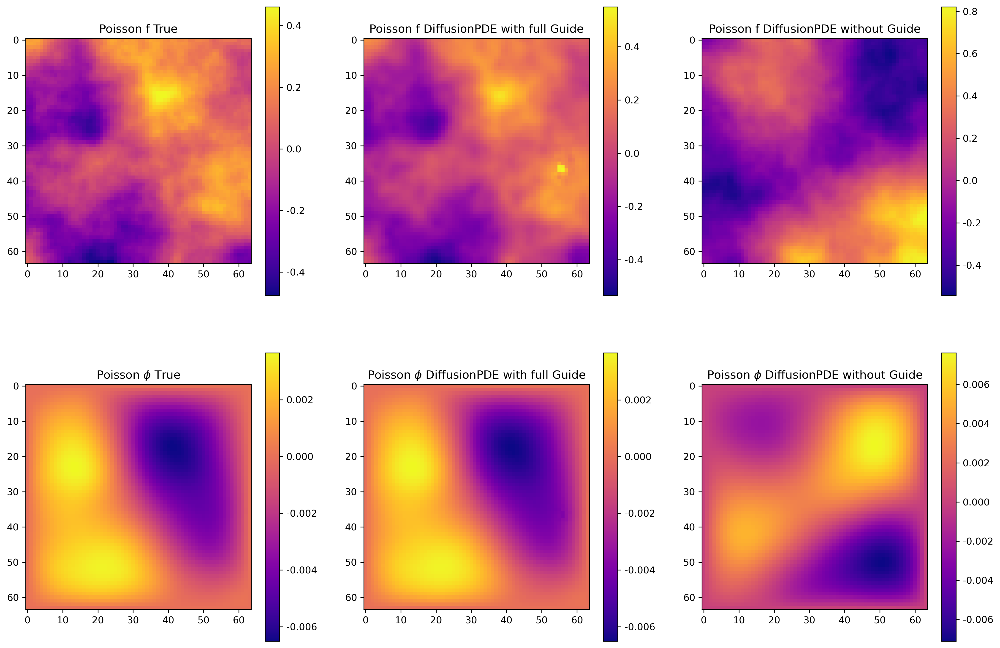

In [15]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_testdata['f_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f True')
plt.subplot(2, 3, 4)
plt.imshow(poisson_testdata['phi_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ True')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE with full Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE with full Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'Poisson $\\phi$ DM4PDE with $\\phi$ Guide')

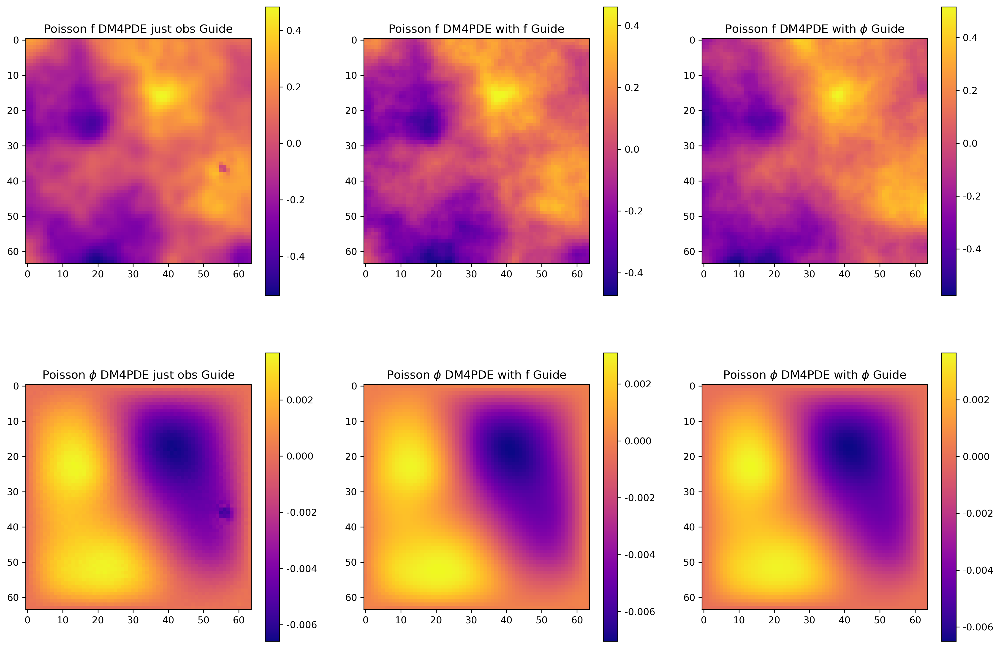

In [16]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(poisson_phi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with $\phi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with $\phi$ Guide')

#### Sample Helmholtz

In [60]:
hel_config={
    "data": {
        "name": 'Helmholtz',
        "datapath": '/data0/zhangxf/testPDEdata/helmholtz/testhelmholtz(k=10)_5000-64-64_1.mat',
        "offset": 0,
        "obs_size": 500,
        "pdeparam": 10
    },
    "test": {
        "pre-trained": f'{model_path}/DM4poisson_helmholtz-new.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 800,
        "zeta_obs_u": 6000,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [51]:
# Global True
helmholtz_testdata = scipy.io.loadmat('/data0/zhangxf/testPDEdata/helmholtz/testhelmholtz(k=10)_5000-64-64_1.mat')
helmholtz_testdata['f_data'].shape, helmholtz_testdata['psi_data'].shape

((5000, 64, 64), (5000, 64, 64))

In [54]:
# Sample without guide
hel_config['generate']['guide'] = False
helmholtz_f_sample, helmholtz_psi_sample, helmholtz_f_index, helmholtz_psi_index = generate_helmholtz(hel_config)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [01:12<00:00, 27.51step/s]

Done.


In [61]:
# Sample with obs_loss (f & phi) and pde_loss guide
hel_config1 = copy.deepcopy(hel_config)
hel_config1['generate']['guide'] = True
helmholtz_f_sample_guide1, helmholtz_psi_sample_guide1, helmholtz_f_index1, helmholtz_psi_index1 = generate_helmholtz(hel_config1)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:12<00:00,  6.39step/s]

Relative error of a: 0.1636347017234206
Relative error of u: 0.6125938587653184
Done.


In [63]:
# Forward problems: Sample with just obs_loss guide
hel_config2 = copy.deepcopy(hel_config)
hel_config2['generate']['guide'] = True
hel_config2['generate']['zeta_pde'] = 0
helmholtz_f_sample_guide2, helmholtz_psi_sample_guide2, helmholtz_f_index2, helmholtz_psi_index2 = generate_helmholtz(hel_config2)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:13<00:00,  6.39step/s]

Relative error of a: 0.3722461528918597
Relative error of u: 0.6155005125417901
Done.


In [64]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
hel_config3 = copy.deepcopy(hel_config)
hel_config3['generate']['full'] = True
hel_config3['generate']['guide'] = True
hel_config3['generate']['zeta_obs_u'] = 0
helmholtz_f_sample_guide3, helmholtz_psi_sample_guide3, helmholtz_f_index3, helmholtz_psi_index3 = generate_helmholtz(hel_config3)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:11<00:00,  6.42step/s]

Relative error of a: 0.0196875074392861
Relative error of u: 1.0003834721801261
Done.


In [65]:
# Inverse problems: Sample with obs_loss (just psi) and pde_loss guide
hel_config4 = copy.deepcopy(hel_config)
hel_config4['generate']['full'] = True
hel_config4['generate']['guide'] = True
hel_config4['generate']['zeta_obs_a'] = 0
helmholtz_f_sample_guide4, helmholtz_psi_sample_guide4, helmholtz_f_index4, helmholtz_psi_index4 = generate_helmholtz(hel_config4)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_helmholtz-new.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:16<00:00,  6.33step/s]

Relative error of a: 8.930554027472237
Relative error of u: 0.0010460809980669295
Done.


Text(0.5, 1.0, 'helmholtz $\\psi$ DiffusionPDE without Guide')

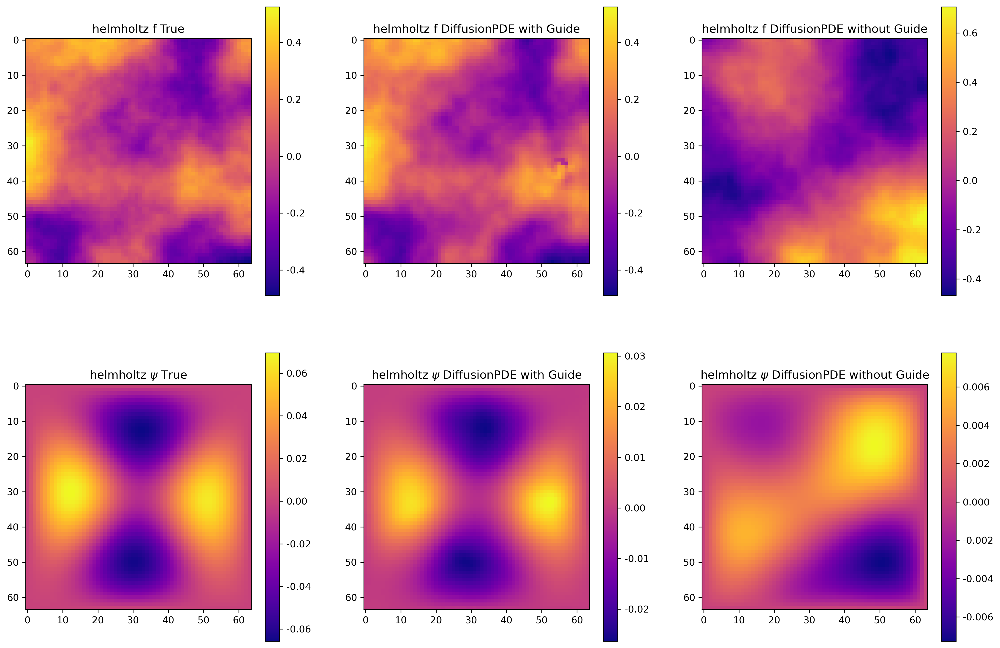

In [62]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(helmholtz_testdata['f_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('helmholtz f True')
plt.subplot(2, 3, 4)
plt.imshow(helmholtz_testdata['psi_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ True')
plt.subplot(2, 3, 2)
plt.imshow(helmholtz_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DiffusionPDE with Guide')
plt.subplot(2, 3, 5)
plt.imshow(helmholtz_psi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DiffusionPDE with Guide')
plt.subplot(2, 3, 3)
plt.imshow(helmholtz_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(helmholtz_psi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'helmholtz $\\psi$ DM4PDE with $\\psi$ Guide')

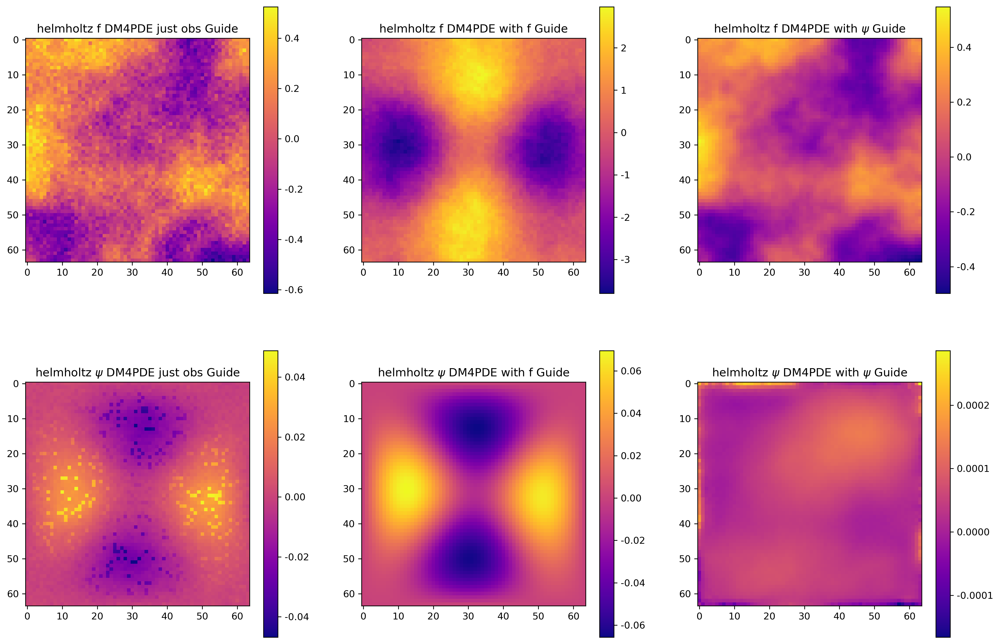

In [67]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(helmholtz_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('helmholtz f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(helmholtz_psi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(helmholtz_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(helmholtz_psi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(helmholtz_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DM4PDE with $\psi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(helmholtz_psi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE with $\psi$ Guide')

#### data view

In [9]:
k = 20
helmholtz_testdata = scipy.io.loadmat(f'/data0/zhangxf/PDEdata/helmholtz/helmholtz_5000-64-64_k{k}.mat')
helmholtz_testf = helmholtz_testdata['f_data']
helmholtz_testpsi = helmholtz_testdata['psi_data']
merge_helmholtz_testdata = np.load(f'/data0/zhangxf/PDEdata/multi-merged/mergehelmholtzk_0_k{k}.npy')

In [5]:
merge_helmholtz_testdata.shape, helmholtz_testf.shape, helmholtz_testpsi.shape

((64, 64, 2), (5000, 64, 64), (5000, 64, 64))

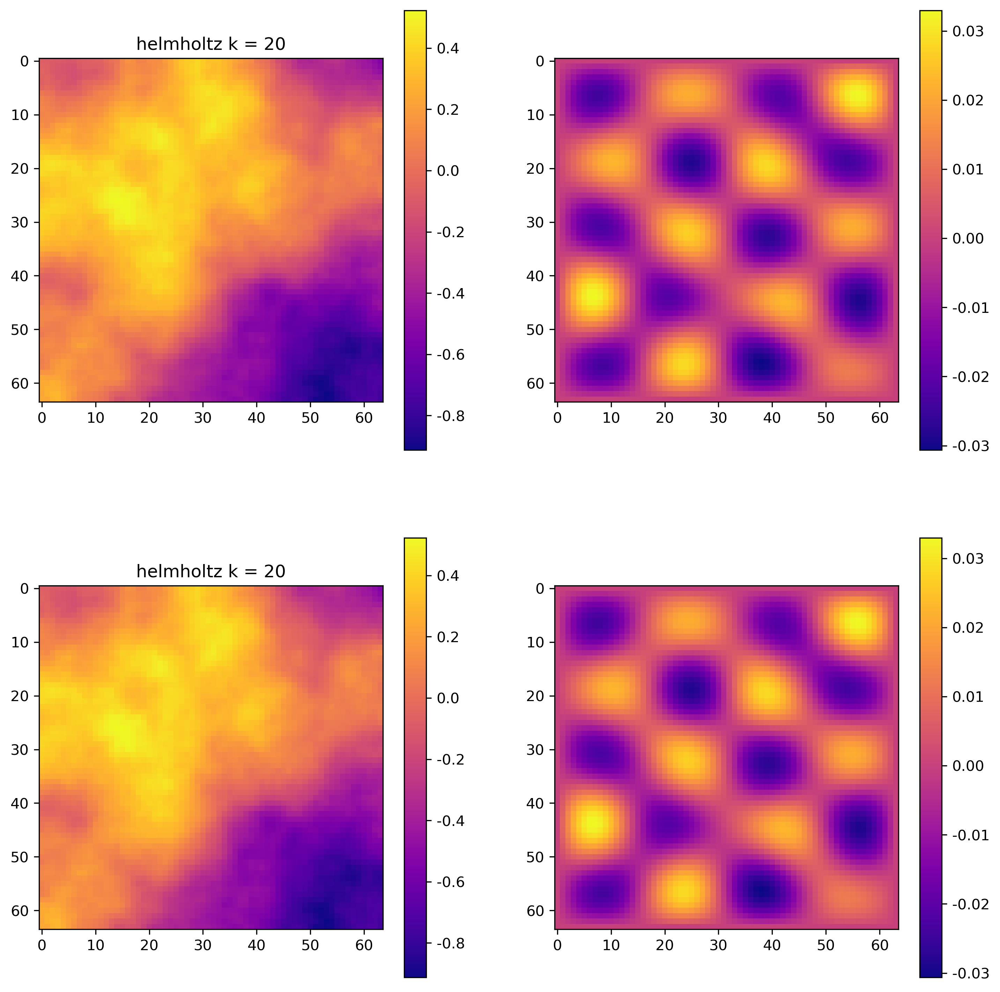

In [10]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(helmholtz_testf[0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(f'helmholtz k = {k}')
plt.subplot(2, 3, 2)
plt.imshow(helmholtz_testpsi[0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.subplot(2, 3, 4)
plt.imshow(merge_helmholtz_testdata[:, :, 0], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(f'helmholtz k = {k}')
plt.subplot(2, 3, 5)
plt.imshow(merge_helmholtz_testdata[:, :, 1], cmap='plasma', interpolation='nearest')
plt.colorbar()

#### Eval

In [ ]:
!python -u DM4PDEsampletest.py --pdetype='poisson' --evaltype='obseval' --pdeloss=True --problem='forward'
!python -u DM4PDEsampletest.py --pdetype='poisson' --evaltype='obseval' --pdeloss=True --problem='inverse'

In [ ]:
!python -u DM4PDEsampletest.py --pdetype='helmholtz' --pdeloss=True --problem='forward'

In [ ]:
!python -u DM4PDEsampletest.py --pdetype='helmholtz' --pdeloss=True --problem='forward'

### Poisson + Nonbounded Navier-Stokes

#### Training

In [ ]:
!python -u merge_data.py --type='poisson' --round=5 --n=5000 --s=64 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-nonboundedns_64/
!python -u merge_data.py --type='nsnonbounded' --round=5 --n=5000 --s=64 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-nonboundedns_64/

!python -u merge_data.py --type='poisson' --round=5 --n=10000 --s=128 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-nonboundedns_128/
!python -u merge_data.py --type='nsnonbounded' --round=5 --n=10000 --s=128 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-nonboundedns_128/

# !python -u generate_labels.py

In [ ]:
# !CUDA_VISIBLE_DEVICES=3,5,6
# 64*64
!torchrun --master_addr=127.0.0.1 --master_port=12357 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/models/DM4PDE/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-poisson-nonboundedns_64/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

# 128*128
!torchrun --master_addr=127.0.0.1 --master_port=12356 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/models/DM4PDE/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-poisson-nonboundedns_128/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

#### Sample Poisson

In [9]:
poisson_config={
    "data": {
        "name": 'Poisson',
        "datapath": '/data0/zhangxf/testPDEdata/poisson/testpoisson_5000-64-64_1.mat',
        "offset": 0,
        "obs_size": 500
    },
    "test": {
        "pre-trained": '/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 800,
        "zeta_obs_u": 4000,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [10]:
# Global True
poisson_testdata = scipy.io.loadmat('/data0/zhangxf/testPDEdata/poisson/testpoisson_5000-64-64_1.mat')
poisson_testdata['f_data'].shape, poisson_testdata['phi_data'].shape

((5000, 64, 64), (5000, 64, 64))

In [11]:
# Sample without guide
poisson_config['generate']['guide'] = False
poisson_f_sample, poisson_phi_sample, poisson_f_index, poisson_phi_index = generate_poisson(poisson_config)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [01:17<00:00, 25.78step/s]

Done.


In [12]:
# Sample without obs_loss (f & phi) and pde_loss guide
poisson_config1 = copy.deepcopy(poisson_config)
poisson_config1['generate']['guide'] = True
poisson_f_sample_guide1, poisson_phi_sample_guide1, poisson_f_index1, poisson_phi_index1 = generate_poisson(poisson_config1)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:07<00:00,  6.51step/s]

Relative error of a: 0.15176143493299132
Relative error of u: 0.012677275827904552
Done.


In [14]:
# No PDE loss: Sample with just obs_loss guide
poisson_config2 = copy.deepcopy(poisson_config)
poisson_config2['generate']['guide'] = True
poisson_config2['generate']['zeta_pde'] = 0
poisson_f_sample_guide2, poisson_phi_sample_guide2, poisson_f_index2, poisson_phi_index2 = generate_poisson(poisson_config2)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:14<00:00,  6.36step/s]

Relative error of a: 0.14712577427219053
Relative error of u: 0.012166527940883153
Done.


In [15]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
poisson_config3 = copy.deepcopy(poisson_config)
poisson_config3['generate']['full'] = True
poisson_config3['generate']['guide'] = True
poisson_config3['generate']['zeta_obs_u'] = 0
poisson_f_sample_guide3, poisson_phi_sample_guide3, poisson_f_index3, poisson_phi_index3 = generate_poisson(poisson_config3)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:15<00:00,  6.34step/s]

Relative error of a: 0.0405201677638341
Relative error of u: 2.036452797645948
Done.


In [16]:
# Inverse problems: Sample with obs_loss (just phi) and pde_loss guide
poisson_config4 = copy.deepcopy(poisson_config)
poisson_config4['generate']['full'] = True
poisson_config4['generate']['guide'] = True
poisson_config4['generate']['zeta_obs_a'] = 0
poisson_f_sample_guide4, poisson_phi_sample_guide4, poisson_f_index4, poisson_phi_index4 = generate_poisson(poisson_config4)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:09<00:00,  6.47step/s]

Relative error of a: 0.25197836047422284
Relative error of u: 0.0034994929418432157
Done.


Text(0.5, 1.0, 'Poisson $\\phi$ DiffusionPDE without Guide')

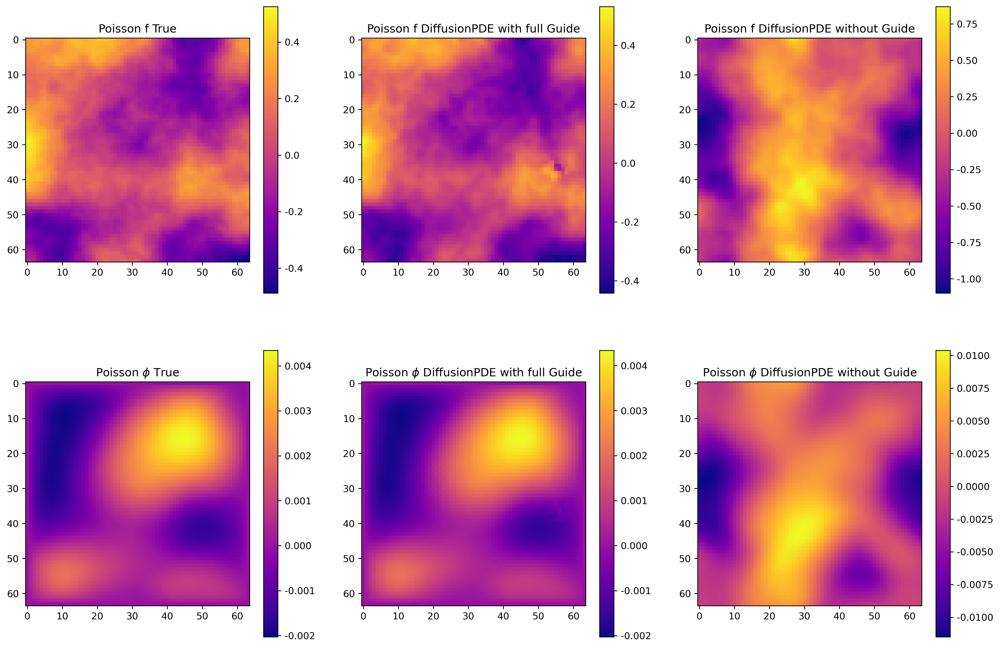

In [13]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_testdata['f_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f True')
plt.subplot(2, 3, 4)
plt.imshow(poisson_testdata['phi_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ True')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE with full Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE with full Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'Poisson $\\phi$ DM4PDE with $\\phi$ Guide')

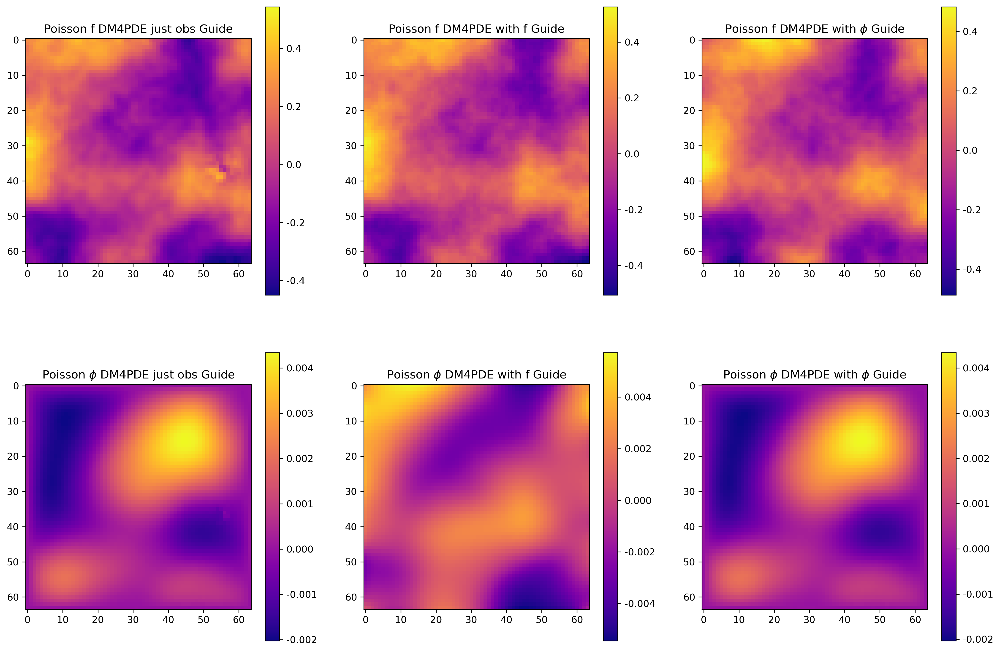

In [17]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(poisson_phi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with $\phi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with $\phi$ Guide')

#### Sample Nonbounded Navier-Stokes

In [5]:
nonboundedns_config={
    "data": {
        "name": 'nonboundedns',
        "datapath": '/data0/zhangxf/PDEdata/nsnonbounded/ns_5000-64-64-10_1.mat',
        "offset": 0,
        "obs_size": 500
    },
    "test": {
        "pre-trained": '/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 1,
        "zeta_obs_u": 1,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [6]:
# Global True
nonboundedns_testdata = {}
with h5py.File('/data0/zhangxf/PDEdata/nsnonbounded/ns_5000-64-64-10_1.mat', 'r') as file:
    for key in file.keys():
        nonboundedns_testdata[key] = file[key][:]
nonboundedns_testdata['a'].shape, nonboundedns_testdata['u'].shape

((5000, 64, 64), (5000, 64, 64, 10))

In [7]:
# Sample without guide
nonboundedns_config['generate']['guide'] = False
nonboundedns_f_sample, nonboundedns_phi_sample, nonboundedns_f_index, nonboundedns_phi_index = generate_ns_nonbounded(nonboundedns_config)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:16<00:00,  6.31step/s]

Done.


In [8]:
# Sample without obs_loss (f & phi) and pde_loss guide
nonboundedns_config1 = copy.deepcopy(nonboundedns_config)
nonboundedns_config1['generate']['guide'] = True
nonboundedns_f_sample_guide1, nonboundedns_phi_sample_guide1, nonboundedns_f_index1, nonboundedns_phi_index1 = generate_ns_nonbounded(nonboundedns_config1)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:09<00:00,  6.45step/s]

Relative error of a: 0.06089119313253606
Relative error of u: 0.006625106298355314
Done.


In [9]:
# No PDE loss: Sample with just obs_loss guide
nonboundedns_config2 = copy.deepcopy(nonboundedns_config)
nonboundedns_config2['generate']['guide'] = True
nonboundedns_config2['generate']['zeta_pde'] = 0
nonboundedns_f_sample_guide2, nonboundedns_phi_sample_guide2, nonboundedns_f_index2, nonboundedns_phi_index2 = generate_ns_nonbounded(nonboundedns_config2)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:06<00:00,  6.53step/s]

Relative error of a: 0.061604488960983896
Relative error of u: 0.004777178731571822
Done.


In [10]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
nonboundedns_config3 = copy.deepcopy(nonboundedns_config)
nonboundedns_config3['generate']['full'] = True
nonboundedns_config3['generate']['guide'] = True
nonboundedns_config3['generate']['zeta_obs_u'] = 0
nonboundedns_f_sample_guide3, nonboundedns_phi_sample_guide3, nonboundedns_f_index3, nonboundedns_phi_index3 = generate_ns_nonbounded(nonboundedns_config3)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:05<00:00,  6.56step/s]

Relative error of a: 0.004434197834262028
Relative error of u: 0.028812720493949413
Done.


In [11]:
# Inverse problems: Sample with obs_loss (just phi) and pde_loss guide
nonboundedns_config4 = copy.deepcopy(nonboundedns_config)
nonboundedns_config4['generate']['full'] = True
nonboundedns_config4['generate']['guide'] = True
nonboundedns_config4['generate']['zeta_obs_a'] = 0
nonboundedns_f_sample_guide4, nonboundedns_phi_sample_guide4, nonboundedns_f_index4, nonboundedns_phi_index4 = generate_ns_nonbounded(nonboundedns_config4)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_nonboundedns-64.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:16<00:00,  6.31step/s]

Relative error of a: 0.06127957512811787
Relative error of u: 0.0061511495789916305
Done.


Text(0.5, 1.0, 'nonboundedns u DiffusionPDE without Guide')

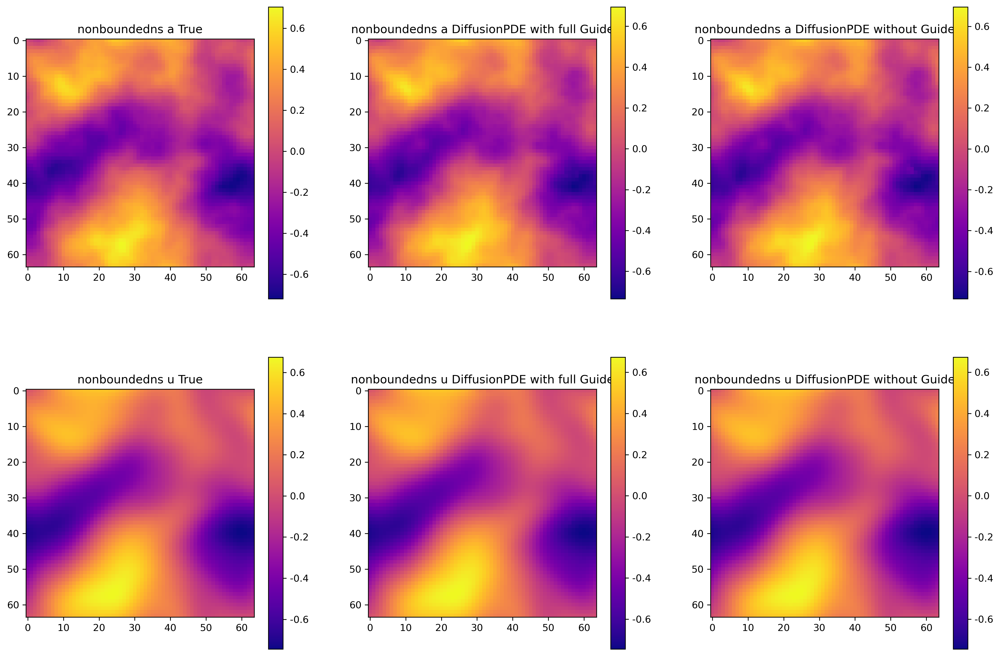

In [14]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(nonboundedns_testdata['a'][nonboundedns_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('nonboundedns a True')
plt.subplot(2, 3, 4)
plt.imshow(nonboundedns_testdata['u'][nonboundedns_config['data']['offset'], :, :, -1], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u True')
plt.subplot(2, 3, 2)
plt.imshow(nonboundedns_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns a DiffusionPDE with full Guide')
plt.subplot(2, 3, 5)
plt.imshow(nonboundedns_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DiffusionPDE with full Guide')
plt.subplot(2, 3, 3)
plt.imshow(nonboundedns_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns a DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(nonboundedns_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DiffusionPDE without Guide')

Text(0.5, 1.0, 'nonboundedns u DM4PDE with u Guide')

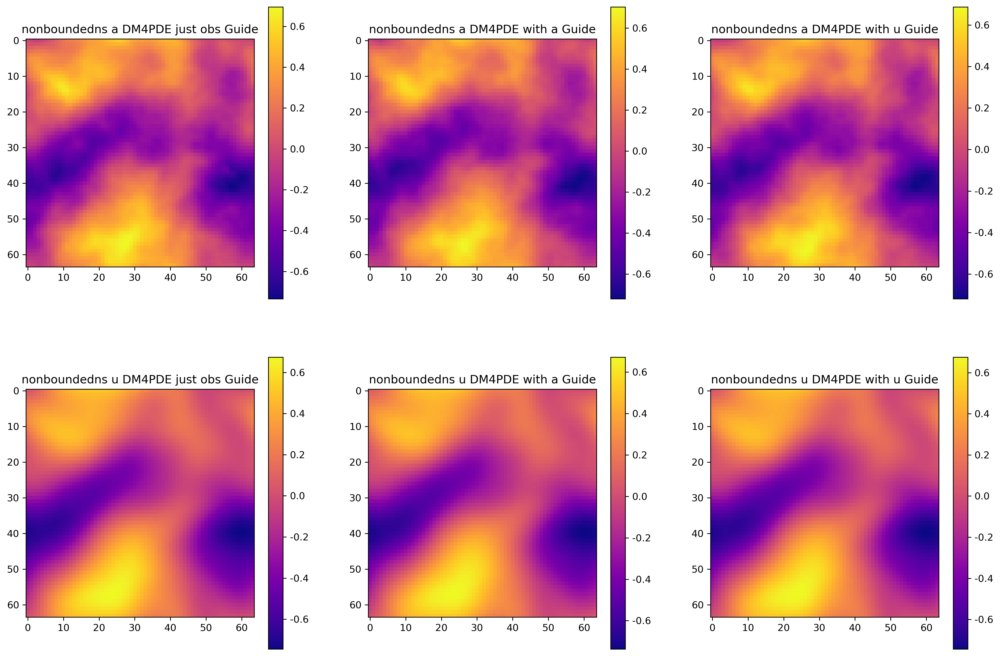

In [15]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(nonboundedns_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('nonboundedns a DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(nonboundedns_phi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(nonboundedns_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns a DM4PDE with a Guide')
plt.subplot(2, 3, 5)
plt.imshow(nonboundedns_phi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DM4PDE with a Guide')
plt.subplot(2, 3, 3)
plt.imshow(nonboundedns_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns a DM4PDE with u Guide')
plt.subplot(2, 3, 6)
plt.imshow(nonboundedns_phi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DM4PDE with u Guide')

### Poisson + Darcy

#### Training

In [ ]:
!python -u merge_data.py --type='poisson' --round=5 --n=10000 --s=128 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-darcy_128/
!python -u merge_data.py --type='darcy' --round=5 --n=10000 --s=128 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-darcy_128/

# !python -u generate_labels.py

In [ ]:
# !CUDA_VISIBLE_DEVICES=1,2,4
!torchrun --master_addr=127.0.0.1 --master_port=12358 --nproc_per_node=3 train.py --outdir=/data0/zhangxf/models/DM4PDE/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-poisson-darcy_128/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

#### Sample Poisson

In [5]:
poisson_config={
    "data": {
        "name": 'Poisson',
        "datapath": '/data0/zhangxf/PDEdata/poisson/poisson_10000-128-128_1.mat',
        "offset": 0,
        "obs_size": 500
    },
    "test": {
        "pre-trained": '/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 800,
        "zeta_obs_u": 4000,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [6]:
# Global True
poisson_testdata = scipy.io.loadmat('/data0/zhangxf/PDEdata/poisson/poisson_10000-128-128_1.mat')
poisson_testdata['f_data'].shape, poisson_testdata['phi_data'].shape

((10000, 128, 128), (10000, 128, 128))

In [7]:
# Sample without guide
poisson_config['generate']['guide'] = False
poisson_f_sample, poisson_phi_sample, poisson_f_index, poisson_phi_index = generate_poisson(poisson_config)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [01:08<00:00, 29.16step/s]


Done.


In [8]:
# Sample without obs_loss (f & phi) and pde_loss guide
poisson_config1 = copy.deepcopy(poisson_config)
poisson_config1['generate']['guide'] = True
poisson_f_sample_guide1, poisson_phi_sample_guide1, poisson_f_index1, poisson_phi_index1 = generate_poisson(poisson_config1)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:46<00:00,  6.98step/s]


Relative error of a: 0.0681049353096662
Relative error of u: 0.007910648649140256
Done.


In [9]:
# No PDE loss: Sample with just obs_loss guide
poisson_config2 = copy.deepcopy(poisson_config)
poisson_config2['generate']['guide'] = True
poisson_config2['generate']['zeta_pde'] = 0
poisson_f_sample_guide2, poisson_phi_sample_guide2, poisson_f_index2, poisson_phi_index2 = generate_poisson(poisson_config2)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:54<00:00,  6.80step/s]


Relative error of a: 0.07078644405700661
Relative error of u: 0.005558418334511044
Done.


In [10]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
poisson_config3 = copy.deepcopy(poisson_config)
poisson_config3['generate']['full'] = True
poisson_config3['generate']['guide'] = True
poisson_config3['generate']['zeta_obs_u'] = 0
poisson_f_sample_guide3, poisson_phi_sample_guide3, poisson_f_index3, poisson_phi_index3 = generate_poisson(poisson_config3)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:31<00:00,  7.36step/s]


Relative error of a: 0.013529337727676454
Relative error of u: 0.11326613289081326
Done.


In [11]:
# Inverse problems: Sample with obs_loss (just phi) and pde_loss guide
poisson_config4 = copy.deepcopy(poisson_config)
poisson_config4['generate']['full'] = True
poisson_config4['generate']['guide'] = True
poisson_config4['generate']['zeta_obs_a'] = 0
poisson_f_sample_guide4, poisson_phi_sample_guide4, poisson_f_index4, poisson_phi_index4 = generate_poisson(poisson_config4)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:03<00:00,  8.23step/s]


Relative error of a: 0.12974836289967198
Relative error of u: 0.001031706935666583
Done.


Text(0.5, 1.0, 'Poisson $\\phi$ DiffusionPDE without Guide')

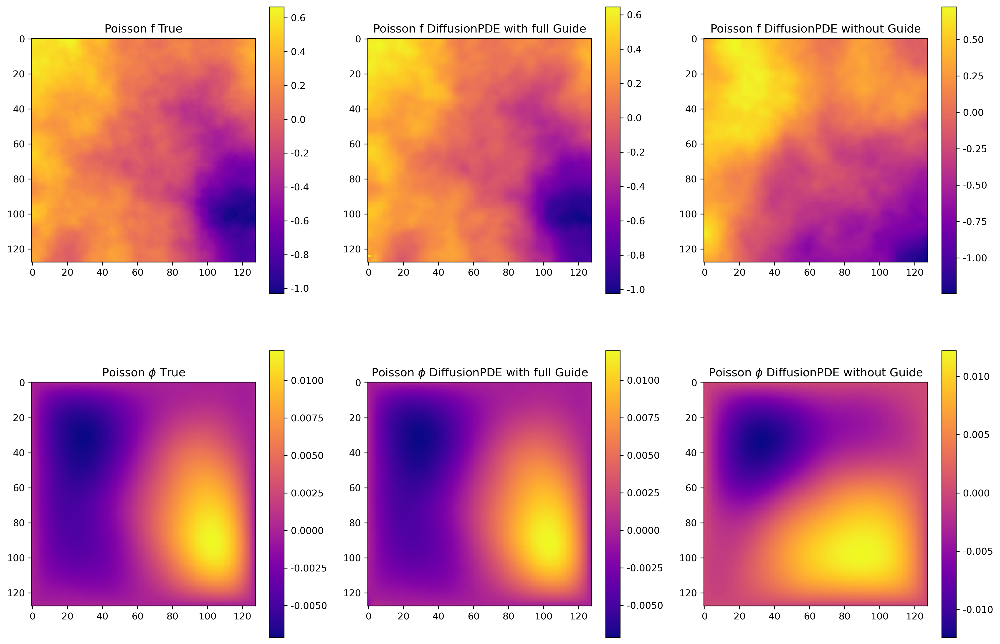

In [12]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_testdata['f_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f True')
plt.subplot(2, 3, 4)
plt.imshow(poisson_testdata['phi_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ True')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE with full Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE with full Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'Poisson $\\phi$ DM4PDE with $\\phi$ Guide')

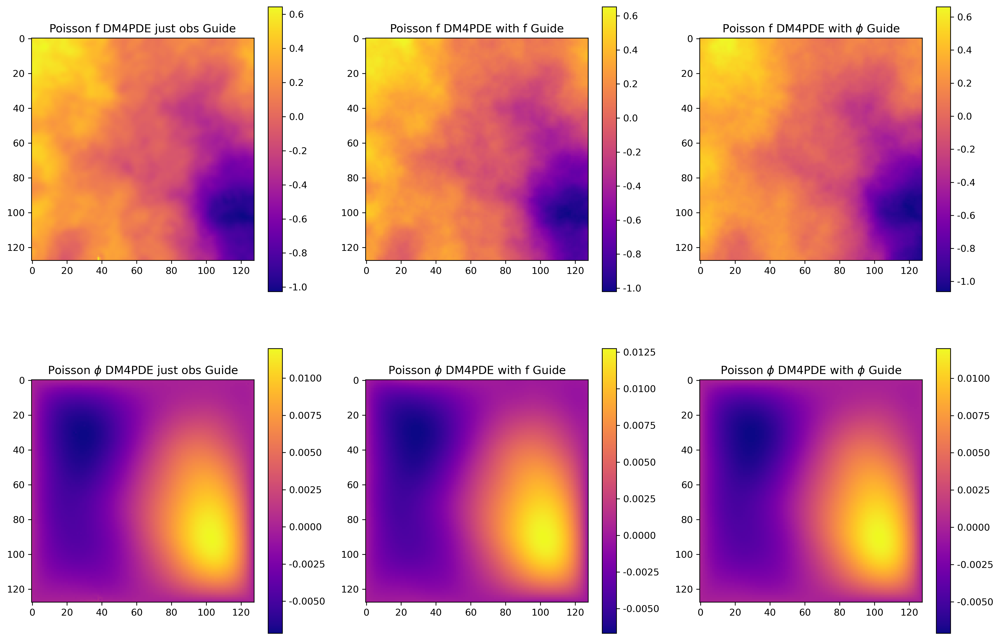

In [13]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(poisson_phi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with $\phi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with $\phi$ Guide')

#### Sample Darcy

In [5]:
darcy_config={
    "data": {
        "name": 'darcy',
        "datapath": '/data0/zhangxf/PDEdata/darcy/darcy_10000-128-128_6.mat',
        "offset": 0,
        "obs_size": 500
    },
    "test": {
        "pre-trained": '/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl',
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 50,
        "zeta_obs_u": 5000,
        "zeta_pde": 100,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [6]:
# Global True
darcy_testdata = {}
with h5py.File('/data0/zhangxf/PDEdata/darcy/darcy_10000-128-128_6.mat', 'r') as file:
    for key in file.keys():
        darcy_testdata[key] = file[key][:]
darcy_testdata['thresh_a_data'].shape, darcy_testdata['thresh_p_data'].shape

((128, 128, 10000), (128, 128, 10000))

In [7]:
# Sample without guide
darcy_config['generate']['guide'] = False
darcy_f_sample, darcy_phi_sample, darcy_f_index, darcy_phi_index = generate_darcy(darcy_config)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:55<00:00,  6.77step/s]


Done.


In [8]:
# Sample without obs_loss (f & phi) and pde_loss guide
darcy_config1 = copy.deepcopy(darcy_config)
darcy_config1['generate']['guide'] = True
darcy_f_sample_guide1, darcy_phi_sample_guide1, darcy_f_index1, darcy_phi_index1 = generate_darcy(darcy_config1)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:53<00:00,  6.81step/s]


Error rate of a: 0.0792236328125
Relative error of u: 0.0495602207286082
Done.


In [9]:
# No PDE loss: Sample with just obs_loss guide
darcy_config2 = copy.deepcopy(darcy_config)
darcy_config2['generate']['guide'] = True
darcy_config2['generate']['zeta_pde'] = 0
darcy_f_sample_guide2, darcy_phi_sample_guide2, darcy_f_index2, darcy_phi_index2 = generate_darcy(darcy_config2)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:49<00:00,  6.91step/s]


Error rate of a: 0.07928466796875
Relative error of u: 0.04934607219000462
Done.


In [10]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
darcy_config3 = copy.deepcopy(darcy_config)
darcy_config3['generate']['full'] = True
darcy_config3['generate']['guide'] = True
darcy_config3['generate']['zeta_obs_u'] = 0
darcy_f_sample_guide3, darcy_phi_sample_guide3, darcy_f_index3, darcy_phi_index3 = generate_darcy(darcy_config3)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:36<00:00,  5.95step/s]


Error rate of a: 0.0
Relative error of u: 2.3496188339462227
Done.


In [11]:
# Inverse problems: Sample with obs_loss (just phi) and pde_loss guide
darcy_config4 = copy.deepcopy(darcy_config)
darcy_config4['generate']['full'] = True
darcy_config4['generate']['guide'] = True
darcy_config4['generate']['zeta_obs_a'] = 0
darcy_f_sample_guide4, darcy_phi_sample_guide4, darcy_f_index4, darcy_phi_index4 = generate_darcy(darcy_config4)

Loading networks from "/data0/zhangxf/models/pretrained-models/DM4poisson_darcy-128.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:16<00:00,  6.31step/s]


Error rate of a: 0.045654296875
Relative error of u: 0.02433185196845412
Done.


Text(0.5, 1.0, 'darcy $\\phi$ DiffusionPDE without Guide')

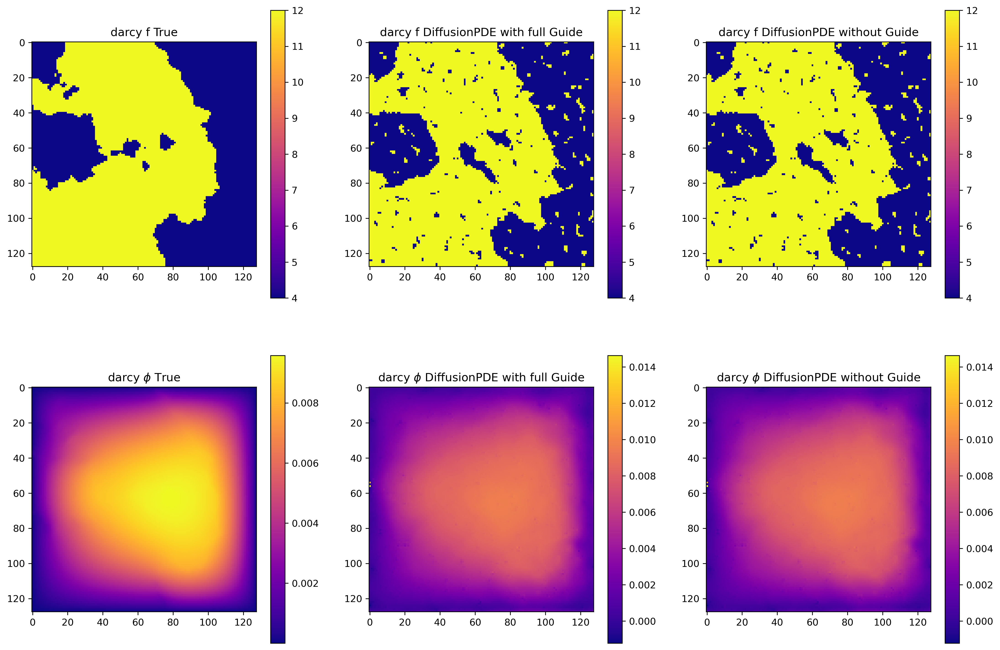

In [12]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(darcy_testdata['thresh_a_data'][:, :, darcy_config['data']['offset']], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('darcy f True')
plt.subplot(2, 3, 4)
plt.imshow(darcy_testdata['thresh_p_data'][:, :, darcy_config['data']['offset']], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy $\phi$ True')
plt.subplot(2, 3, 2)
plt.imshow(darcy_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy f DiffusionPDE with full Guide')
plt.subplot(2, 3, 5)
plt.imshow(darcy_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy $\phi$ DiffusionPDE with full Guide')
plt.subplot(2, 3, 3)
plt.imshow(darcy_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(darcy_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy $\phi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'darcy $\\phi$ DM4PDE with $\\phi$ Guide')

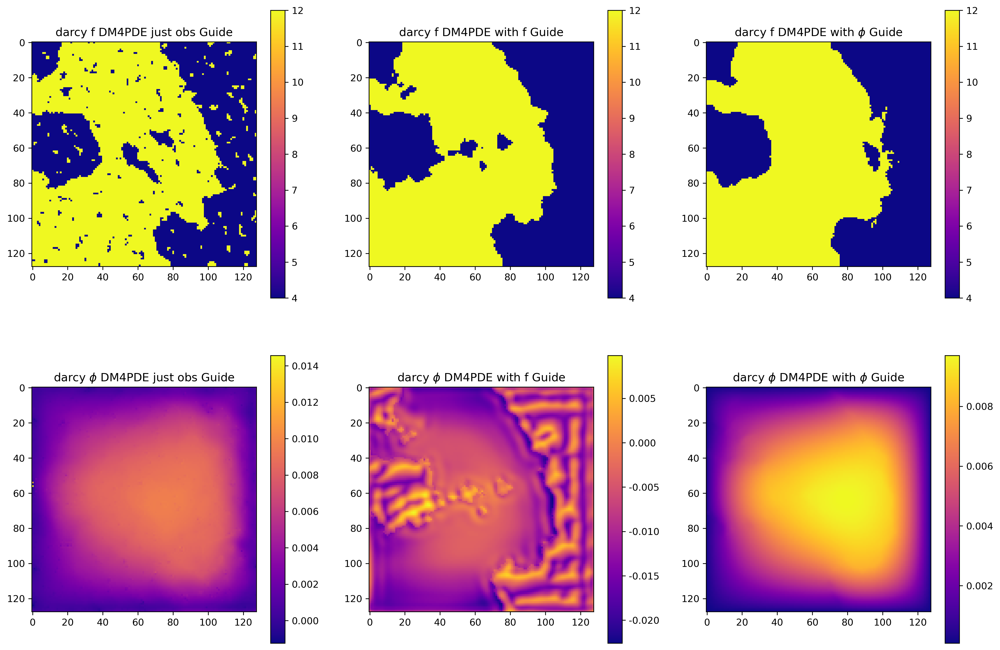

In [13]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(darcy_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('darcy f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(darcy_phi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy $\phi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(darcy_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(darcy_phi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy $\phi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(darcy_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy f DM4PDE with $\phi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(darcy_phi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'darcy $\phi$ DM4PDE with $\phi$ Guide')

### Poisson + Helmholtz + Nonbounded Navier-Stokes

#### Training

In [ ]:
!python -u merge_data.py --type='poisson' --round=5 --n=10000 --s=128 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-helmholtz-ns_128/
!python -u merge_data.py --type='helmhlotzk' --round=5 --n=10000 --s=128 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-helmholtz-ns_128/
!python -u merge_data.py --type='nsnonbounded' --round=5 --n=10000 --s=128 --mixed=True --save=/data0/zhangxf/PDEdata/multi-poisson-helmholtz-ns_128/

In [ ]:
# !CUDA_VISIBLE_DEVICES=1,2,4
# pretrained-multi 00006
!torchrun --master_addr=127.0.0.1 --master_port=12355 --nproc_per_node=4 train.py --outdir=/data0/zhangxf/models/DM4PDE/pretrained-multi --data=/data0/zhangxf/PDEdata/multi-poisson-helmholtz-ns_128/ --cond=0 --arch=ddpmpp --batch=60 --batch-gpu=20 --tick=10 --snap=50 --dump=100 --duration=20 --ema=0.05

In [1]:
DM4phn = "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"

#### Sample Poisson

In [6]:
poisson_config={
    "data": {
        "name": 'Poisson',
        "datapath": '/data0/zhangxf/PDEdata/poisson/poisson_10000-128-128_1.mat',
        "offset": 0,
        "obs_size": 500
    },
    "test": {
        "pre-trained": DM4phn,
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 800,
        "zeta_obs_u": 4000,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [7]:
# Global True
poisson_testdata = scipy.io.loadmat('/data0/zhangxf/PDEdata/poisson/poisson_10000-128-128_1.mat')
poisson_testdata['f_data'].shape, poisson_testdata['phi_data'].shape

((10000, 128, 128), (10000, 128, 128))

In [8]:
# Sample without guide
poisson_config['generate']['guide'] = False
poisson_f_sample, poisson_phi_sample, poisson_f_index, poisson_phi_index = generate_poisson(poisson_config)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [01:19<00:00, 25.11step/s]


Done.


In [9]:
# Sample without obs_loss (f & phi) and pde_loss guide
poisson_config1 = copy.deepcopy(poisson_config)
poisson_config1['generate']['guide'] = True
poisson_f_sample_guide1, poisson_phi_sample_guide1, poisson_f_index1, poisson_phi_index1 = generate_poisson(poisson_config1)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [05:00<00:00,  6.66step/s]


Relative error of a: 0.06695251598819744
Relative error of u: 0.005100351968099012
Done.


In [10]:
# No PDE loss: Sample with just obs_loss guide
poisson_config2 = copy.deepcopy(poisson_config)
poisson_config2['generate']['guide'] = True
poisson_config2['generate']['zeta_pde'] = 0
poisson_f_sample_guide2, poisson_phi_sample_guide2, poisson_f_index2, poisson_phi_index2 = generate_poisson(poisson_config2)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:48<00:00,  6.94step/s]


Relative error of a: 0.06770971303744286
Relative error of u: 0.004854068581534499
Done.


In [11]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
poisson_config3 = copy.deepcopy(poisson_config)
poisson_config3['generate']['full'] = True
poisson_config3['generate']['guide'] = True
poisson_config3['generate']['zeta_obs_u'] = 0
poisson_f_sample_guide3, poisson_phi_sample_guide3, poisson_f_index3, poisson_phi_index3 = generate_poisson(poisson_config3)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:51<00:00,  6.86step/s]


Relative error of a: 0.01152282901367461
Relative error of u: 0.9739396920536675
Done.


In [12]:
# Inverse problems: Sample with obs_loss (just phi) and pde_loss guide
poisson_config4 = copy.deepcopy(poisson_config)
poisson_config4['generate']['full'] = True
poisson_config4['generate']['guide'] = True
poisson_config4['generate']['zeta_obs_a'] = 0
poisson_f_sample_guide4, poisson_phi_sample_guide4, poisson_f_index4, poisson_phi_index4 = generate_poisson(poisson_config4)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:43<00:00,  7.06step/s]


Relative error of a: 0.1396642500474537
Relative error of u: 0.0012735209528046741
Done.


Text(0.5, 1.0, 'Poisson $\\phi$ DiffusionPDE without Guide')

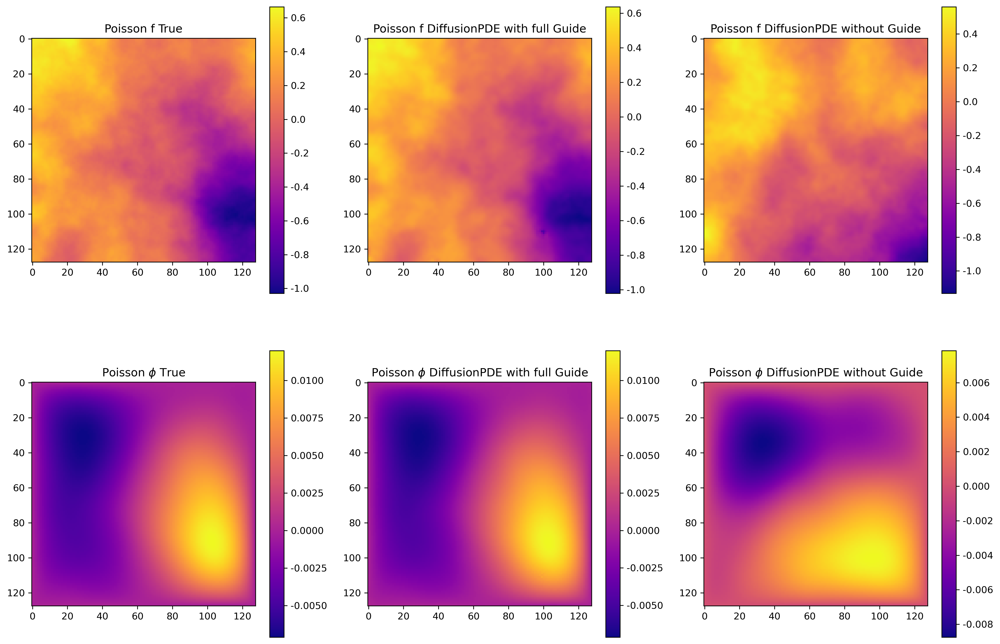

In [13]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_testdata['f_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f True')
plt.subplot(2, 3, 4)
plt.imshow(poisson_testdata['phi_data'][poisson_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ True')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE with full Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE with full Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'Poisson $\\phi$ DM4PDE with $\\phi$ Guide')

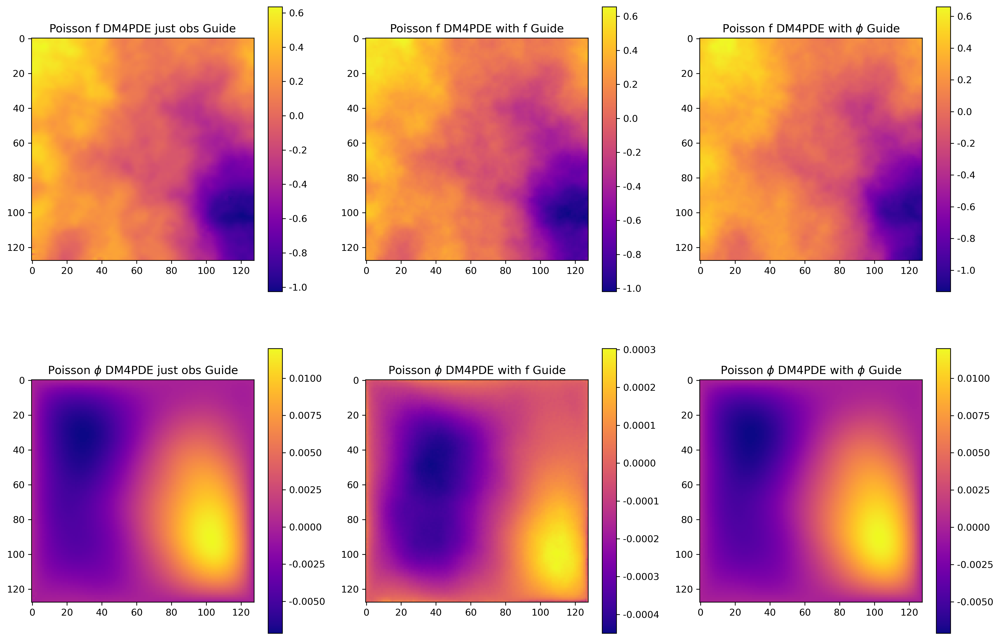

In [14]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(poisson_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('Poisson f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(poisson_phi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(poisson_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(poisson_phi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(poisson_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson f DM4PDE with $\phi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(poisson_phi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'Poisson $\phi$ DM4PDE with $\phi$ Guide')

#### Sample Helmholtz

In [31]:
hel_config={
    "data": {
        "name": 'Helmholtz',
        "datapath": '/data0/zhangxf/PDEdata/helmholtz/helmholtz_10000-128-128_k3.mat',
        "offset": 0,
        "obs_size": 500,
        "pdeparam": 3
    },
    "test": {
        "pre-trained": DM4phn,
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 800,
        "zeta_obs_u": 6000,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [32]:
# Global True
helmholtz_testdata = scipy.io.loadmat('/data0/zhangxf/PDEdata/helmholtz/helmholtz_10000-128-128_k3.mat')
helmholtz_testdata['f_data'].shape, helmholtz_testdata['psi_data'].shape

((10000, 128, 128), (10000, 128, 128))

In [33]:
# Sample without guide
hel_config['generate']['guide'] = False
helmholtz_f_sample, helmholtz_psi_sample, helmholtz_f_index, helmholtz_psi_index = generate_helmholtz(hel_config)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [01:08<00:00, 29.29step/s]


Done.


In [34]:
# Sample with obs_loss (f & phi) and pde_loss guide
hel_config1 = copy.deepcopy(hel_config)
hel_config1['generate']['guide'] = True
helmholtz_f_sample_guide1, helmholtz_psi_sample_guide1, helmholtz_f_index1, helmholtz_psi_index1 = generate_helmholtz(hel_config1)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:47<00:00,  6.96step/s]


Relative error of a: 0.06558004728470694
Relative error of u: 0.0029477209780336827
Done.


In [35]:
# Forward problems: Sample with just obs_loss guide
hel_config2 = copy.deepcopy(hel_config)
hel_config2['generate']['guide'] = True
hel_config2['generate']['zeta_pde'] = 0
helmholtz_f_sample_guide2, helmholtz_psi_sample_guide2, helmholtz_f_index2, helmholtz_psi_index2 = generate_helmholtz(hel_config2)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:51<00:00,  6.85step/s]


Relative error of a: 0.06669130811815727
Relative error of u: 0.004026585124829998
Done.


In [36]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
hel_config3 = copy.deepcopy(hel_config)
hel_config3['generate']['full'] = True
hel_config3['generate']['guide'] = True
hel_config3['generate']['zeta_obs_u'] = 0
helmholtz_f_sample_guide3, helmholtz_psi_sample_guide3, helmholtz_f_index3, helmholtz_psi_index3 = generate_helmholtz(hel_config3)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:50<00:00,  6.88step/s]


Relative error of a: 0.00857359564748124
Relative error of u: 0.985270749526122
Done.


In [37]:
# Inverse problems: Sample with obs_loss (just psi) and pde_loss guide
hel_config4 = copy.deepcopy(hel_config)
hel_config4['generate']['full'] = True
hel_config4['generate']['guide'] = True
hel_config4['generate']['zeta_obs_a'] = 0
helmholtz_f_sample_guide4, helmholtz_psi_sample_guide4, helmholtz_f_index4, helmholtz_psi_index4 = generate_helmholtz(hel_config4)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:51<00:00,  6.86step/s]


Relative error of a: 0.1318765407452582
Relative error of u: 0.0011593493154383354
Done.


Text(0.5, 1.0, 'helmholtz $\\psi$ DiffusionPDE without Guide')

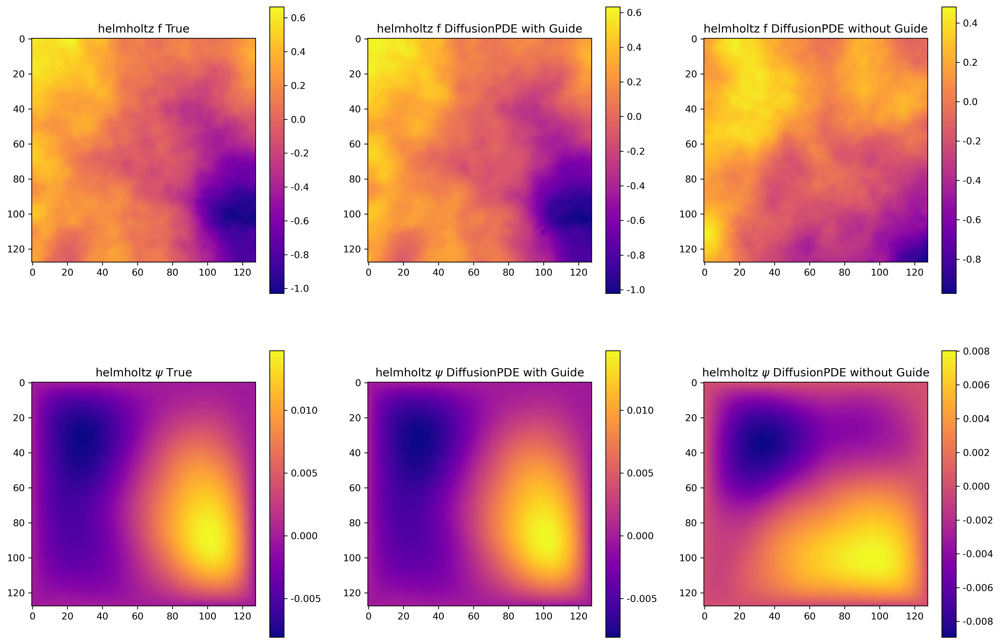

In [38]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(helmholtz_testdata['f_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('helmholtz f True')
plt.subplot(2, 3, 4)
plt.imshow(helmholtz_testdata['psi_data'][hel_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ True')
plt.subplot(2, 3, 2)
plt.imshow(helmholtz_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DiffusionPDE with Guide')
plt.subplot(2, 3, 5)
plt.imshow(helmholtz_psi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DiffusionPDE with Guide')
plt.subplot(2, 3, 3)
plt.imshow(helmholtz_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(helmholtz_psi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DiffusionPDE without Guide')

Text(0.5, 1.0, 'helmholtz $\\psi$ DM4PDE with $\\psi$ Guide')

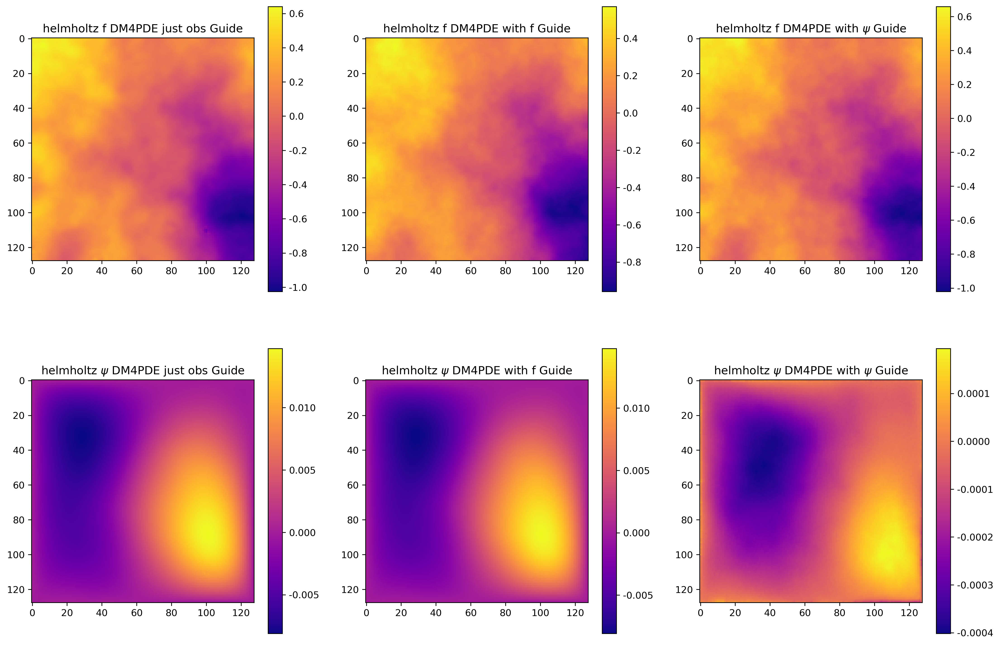

In [39]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(helmholtz_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('helmholtz f DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(helmholtz_psi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(helmholtz_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DM4PDE with f Guide')
plt.subplot(2, 3, 5)
plt.imshow(helmholtz_psi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE with f Guide')
plt.subplot(2, 3, 3)
plt.imshow(helmholtz_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz f DM4PDE with $\psi$ Guide')
plt.subplot(2, 3, 6)
plt.imshow(helmholtz_psi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'helmholtz $\psi$ DM4PDE with $\psi$ Guide')

#### Sample Nonbounded Navier-Stokes

In [40]:
nonboundedns_config={
    "data": {
        "name": 'nonboundedns',
        "datapath": '/data0/zhangxf/PDEdata/nsnonbounded/ns_10000-128-128-10_4.mat',
        "offset": 0,
        "obs_size": 500
    },
    "test": {
        "pre-trained": DM4phn,
        "iterations": 2000
    },
    "generate": {
        "seed": 0,
        "device": 'cuda:7',
        "batch_size": 1,
        "sigma_min": 0.002,
        "sigma_max": 80,
        "rho": 7,
        "zeta_obs_a": 1,
        "zeta_obs_u": 1,
        "zeta_pde": 1,
        "guide": False,
        "full": False
    },
    "output": {
        "file_path": "",
        "save": False,
        "return": True
    }
}

In [41]:
# Global True
nonboundedns_testdata = {}
with h5py.File('/data0/zhangxf/PDEdata/nsnonbounded/ns_10000-128-128-10_4.mat', 'r') as file:
    for key in file.keys():
        nonboundedns_testdata[key] = file[key][:]
nonboundedns_testdata['a'].shape, nonboundedns_testdata['u'].shape

((10000, 128, 128), (10000, 128, 128, 10))

In [42]:
# Sample without guide
nonboundedns_config['generate']['guide'] = False
nonboundedns_f_sample, nonboundedns_phi_sample, nonboundedns_f_index, nonboundedns_phi_index = generate_ns_nonbounded(nonboundedns_config)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:52<00:00,  6.84step/s]


Done.


In [43]:
# Sample without obs_loss (f & phi) and pde_loss guide
nonboundedns_config1 = copy.deepcopy(nonboundedns_config)
nonboundedns_config1['generate']['guide'] = True
nonboundedns_f_sample_guide1, nonboundedns_phi_sample_guide1, nonboundedns_f_index1, nonboundedns_phi_index1 = generate_ns_nonbounded(nonboundedns_config1)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:50<00:00,  6.90step/s]


Relative error of a: 0.059698081639120666
Relative error of u: 0.0036085547999352
Done.


In [44]:
# No PDE loss: Sample with just obs_loss guide
nonboundedns_config2 = copy.deepcopy(nonboundedns_config)
nonboundedns_config2['generate']['guide'] = True
nonboundedns_config2['generate']['zeta_pde'] = 0
nonboundedns_f_sample_guide2, nonboundedns_phi_sample_guide2, nonboundedns_f_index2, nonboundedns_phi_index2 = generate_ns_nonbounded(nonboundedns_config2)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:52<00:00,  6.84step/s]


Relative error of a: 0.05975671054490473
Relative error of u: 0.0037212436315222
Done.


In [45]:
# Forward problems: Sample with obs_loss (just f) and pde_loss guide
nonboundedns_config3 = copy.deepcopy(nonboundedns_config)
nonboundedns_config3['generate']['full'] = True
nonboundedns_config3['generate']['guide'] = True
nonboundedns_config3['generate']['zeta_obs_u'] = 0
nonboundedns_f_sample_guide3, nonboundedns_phi_sample_guide3, nonboundedns_f_index3, nonboundedns_phi_index3 = generate_ns_nonbounded(nonboundedns_config3)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:52<00:00,  6.83step/s]


Relative error of a: 0.003538469506466765
Relative error of u: 1.8778310034162544
Done.


In [46]:
# Inverse problems: Sample with obs_loss (just phi) and pde_loss guide
nonboundedns_config4 = copy.deepcopy(nonboundedns_config)
nonboundedns_config4['generate']['full'] = True
nonboundedns_config4['generate']['guide'] = True
nonboundedns_config4['generate']['zeta_obs_a'] = 0
nonboundedns_f_sample_guide4, nonboundedns_phi_sample_guide4, nonboundedns_f_index4, nonboundedns_phi_index4 = generate_ns_nonbounded(nonboundedns_config4)

Loading networks from "/data0/zhangxf/models/DM4PDE/pretrained-multi/00006--uncond-ddpmpp-edm-gpus4-batch60-fp32/network-snapshot-005511.pkl"...
Generating 1 samples...


100%|██████████| 2000/2000 [04:52<00:00,  6.85step/s]


Relative error of a: 0.07617457936233077
Relative error of u: 0.0033732482303167376
Done.


Text(0.5, 1.0, 'nonboundedns u DiffusionPDE without Guide')

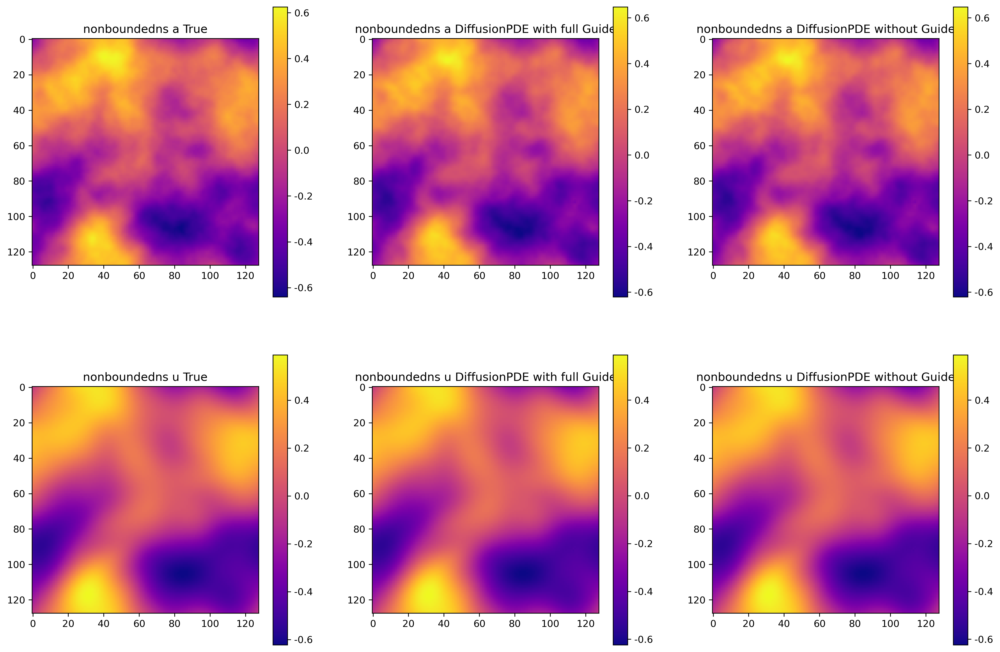

In [47]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(nonboundedns_testdata['a'][nonboundedns_config['data']['offset'], :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('nonboundedns a True')
plt.subplot(2, 3, 4)
plt.imshow(nonboundedns_testdata['u'][nonboundedns_config['data']['offset'], :, :, -1], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u True')
plt.subplot(2, 3, 2)
plt.imshow(nonboundedns_f_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns a DiffusionPDE with full Guide')
plt.subplot(2, 3, 5)
plt.imshow(nonboundedns_phi_sample_guide1[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DiffusionPDE with full Guide')
plt.subplot(2, 3, 3)
plt.imshow(nonboundedns_f_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns a DiffusionPDE without Guide')
plt.subplot(2, 3, 6)
plt.imshow(nonboundedns_phi_sample[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DiffusionPDE without Guide')

Text(0.5, 1.0, 'nonboundedns u DM4PDE with u Guide')

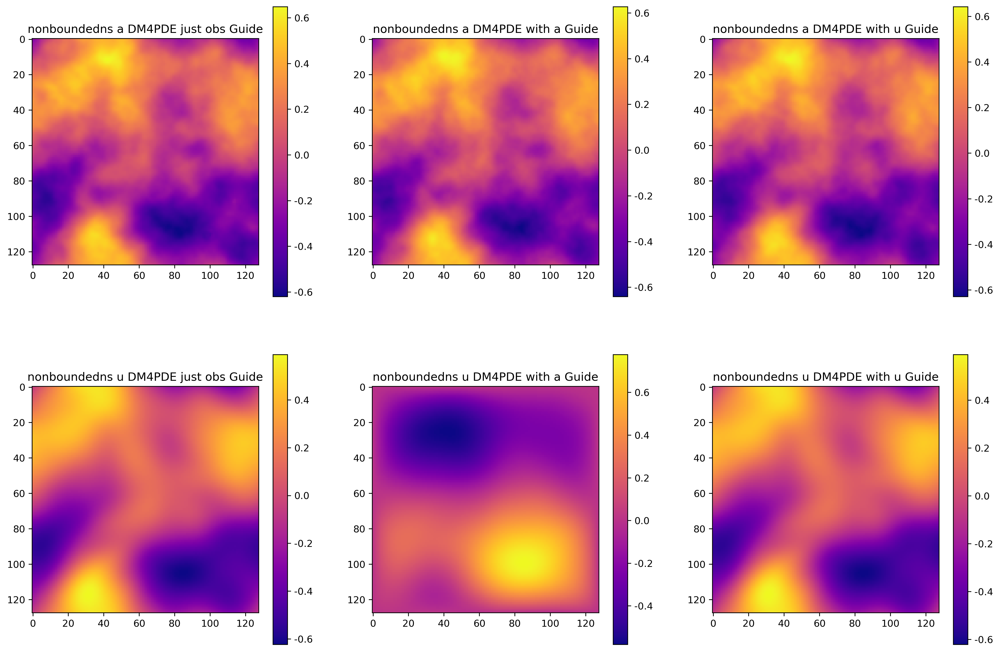

In [48]:
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(nonboundedns_f_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title('nonboundedns a DM4PDE just obs Guide')
plt.subplot(2, 3, 4)
plt.imshow(nonboundedns_phi_sample_guide2[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DM4PDE just obs Guide')
plt.subplot(2, 3, 2)
plt.imshow(nonboundedns_f_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns a DM4PDE with a Guide')
plt.subplot(2, 3, 5)
plt.imshow(nonboundedns_phi_sample_guide3[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DM4PDE with a Guide')
plt.subplot(2, 3, 3)
plt.imshow(nonboundedns_f_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns a DM4PDE with u Guide')
plt.subplot(2, 3, 6)
plt.imshow(nonboundedns_phi_sample_guide4[0, 0, :, :], cmap='plasma', interpolation='nearest')
plt.colorbar()
plt.title(r'nonboundedns u DM4PDE with u Guide')

# FNO, DeepONet